# Script to analyze single emission lines of lensed quasars 

This script is based on PyQSO and fits single emission lines for a given lensed quasar over multi-epochs observations, and gives as outputs the extracted parameters against time, together with some fitting plots

Import packages 

In [1]:
%matplotlib inline
import glob, os, sys, timeit
import matplotlib
import numpy as np
import pandas as pd

sys.path.append('../')
from pyqsofit.PyQSOFit import QSOFit
from astropy.io import fits
from astropy.table import Table
import matplotlib.pyplot as plt
import warnings

plt.rcParams.update({
    'font.family': 'serif', 
    'mathtext.fontset': 'cm',   
    'font.size': 10,            # default font size
    'axes.titlesize': 14,       # title size
    'axes.labelsize': 10,       # x and y labels
    'xtick.labelsize': 10,      # x tick labels
    'ytick.labelsize': 10,      # y tick labels
    'legend.fontsize': 10       # legend text
})

warnings.filterwarnings("ignore")

QSOFit.set_mpl_style()
import astropy
import lmfit
import pyqsofit

print(astropy.__version__)
print(lmfit.__version__)
print(pyqsofit.__version__)

import emcee  # optional, for MCMC

print(emcee.__version__)

7.0.1
1.3.2
2.1.6
3.1.6


## Set up parameters and path to data:

- **`path_ex`** : path to data for the spectrum of all epochs
- **`line_wrange`** : wavelength range in Angstroms of the line to analyze (wider range recommmended for optimal fit of continuum)
- **`line_name`** : name of the line
- **`lam_0`** : rest wavelength in A
- **`narrow`** : *True/False*, to include or not a narrow component for the line
- **`z`** : redshift of the quasar

In [ ]:
path_ex = "1D_extracted_COMBINED"

# Recommended a slightly wider range to ensure good fit of continuum
range_Ha = [6100, 7000]
range_Mg = [2500, 3100]
range_C3 = [1700, 2200]
range_C4 = [1300, 1900]
lam0_Ha = 6562.80
lam0_Mg = 2799.80
lam0_C3 = 1908.70
lam0_C4 = 1549.10

line_wrange = range_Mg # range of wavelength to fit
line_name = "MgII" # name of line to extrcat the parameters (MgII, Ha, CIII, CIV)
lam_0 = lam0_Mg # Fix rest wavelength to get parameters in right units
narrow = False # If the fit includes a narrow component 

z = 1.294 # Redshift

# create a header
hdr0 = fits.Header()
hdr0['Author'] = 'Hengxiaio Guo'
primary_hdu = fits.PrimaryHDU(header=hdr0)

Set prior conditions for lines and continuum

In [3]:
line_priors = np.rec.array([
    (6562.80, 'Ha', 6400, 6800, 'Ha_br', 2,0.0, 0.0, 1e10, 5e-3, 0.004, 0.05, 0.015, 0, 0, 0, 0.05, 1),
    (6562.80, 'Ha', 6400, 6800, 'Ha_na', 1, 0.0, 0.0, 1e10, 1e-3, 5e-4, 0.0009705, 0.01, 1, 1, 0, 0.002, 1),
    (6548.00, 'Ha', 6400, 6800, 'NII6549', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.0009705, 5e-3, 1, 1, 1, 0.001, 1),
    (6583.50, 'Ha', 6400, 6800, 'NII6585', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.0009705, 5e-3, 1, 1, 1, 0.003, 1),
    (6716.40, 'Ha', 6400, 6800, 'SII6718', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.0009705, 5e-3, 1, 1, 2, 0.001, 1),
    (6730.80, 'Ha', 6400, 6800, 'SII6732', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.0009705, 5e-3, 1, 1, 2, 0.001, 1),

    #(4861.00, 'Hb', 4640, 5100, 'Hb_br', 2, 0.0, 0.0, 1e10, 5e-3, 0.004, 0.05, 0.01, 0, 0, 0, 0.01, 1),
    #(4861.00, 'Hb', 4640, 5100, 'Hb_na', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.00169, 0.01, 1, 1, 0, 0.002, 1),
    #(4962.00, 'Hb', 4640, 5100, 'OIII4959c', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.00169, 0.01, 1, 1, 0, 0.002, 1),
    #(5007.00, 'Hb', 4640, 5100, 'OIII5007c', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.00169, 0.01, 1, 1, 0, 0.004, 1),
    #(4962.00, 'Hb', 4640, 5100, 'OIII4959w',   1, 0.0, 0.0, 1e10, 3e-3, 2.3e-4, 0.004,  0.01,  2, 2, 0, 0.001, 1),
    #(5007.00, 'Hb', 4640, 5100, 'OIII5007w',   1, 0.0, 0.0, 1e10, 3e-3, 2.3e-4, 0.004,  0.01,  2, 2, 0, 0.002, 1),
    #(4687.02, 'Hb', 4640, 5100, 'HeII4687_br', 1, 0.0, 0.0, 1e10, 5e-3, 0.004,  0.05,   0.005, 0, 0, 0, 0.001, 1),
    #(4687.02, 'Hb', 4640, 5100, 'HeII4687_na', 1, 0.0, 0.0, 1e10, 1e-3, 2.3e-4, 0.00169, 0.005, 1, 1, 0, 0.001, 1),

    #(3934.78, 'CaII', 3900, 3960, 'CaII3934' , 2, 0.0, 0.0, 1e10, 1e-3, 3.333e-4, 0.00169, 0.01, 99, 0, 0, -0.001, 1),

    #(3728.48, 'OII', 3650, 3800, 'OII3728', 1, 0.0, 0.0, 1e10, 1e-3, 3.333e-4, 0.00169, 0.01, 1, 1, 0, 0.001, 1),

    #(3426.84, 'NeV', 3380, 3480, 'NeV3426',    1, 0.0, 0.0, 1e10, 1e-3, 3.333e-4, 0.00169, 0.01, 0, 0, 0, 0.001, 1),
    #(3426.84, 'NeV', 3380, 3480, 'NeV3426_br', 1, 0.0, 0.0, 1e10, 5e-3, 0.0025,   0.02,   0.01, 0, 0, 0, 0.001, 1),

    (2799.80, 'MgII', 2700, 2900, 'MgII_br', 2, 0.0, 0.0, 1e10, 5e-3, 0.004, 0.05, 0.015, 0, 0, 0, 0.05, 1),
    #(2799.80, 'MgII', 2700, 2900, 'MgII_na', 1, 0.0, 0.0, 1e10, 1e-3, 5e-4, 0.00169, 0.01, 1, 1, 0, 0.002, 1),

    (1908.70, 'CIII', 1700, 1970, 'CIII_br', 2, 0.0, 0.0, 1e10, 5e-3, 0.004, 0.05, 0.015, 99, 0, 0, 0.01, 1),
    #(1908.73, 'CIII', 1700, 1970, 'CIII_na',   1, 0.0, 0.0, 1e10, 1e-3, 5e-4,  0.00169, 0.01,  1, 1, 0, 0.002, 1),
    #(1892.03, 'CIII', 1700, 1970, 'SiIII1892', 1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015,  0.003, 1, 1, 0, 0.005, 1),
    #(1857.40, 'CIII', 1700, 1970, 'AlIII1857', 1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015,  0.003, 1, 1, 0, 0.005, 1),
    #(1816.98, 'CIII', 1700, 1970, 'SiII1816',  1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015,  0.01,  1, 1, 0, 0.0002, 1),
    #(1786.7,  'CIII', 1700, 1970, 'FeII1787',  1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015,  0.01,  1, 1, 0, 0.0002, 1),
    #(1750.26, 'CIII', 1700, 1970, 'NIII1750',  1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015,  0.01,  1, 1, 0, 0.001, 1),
    #(1718.55, 'CIII', 1700, 1900, 'NIV1718',   1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015,  0.01,  1, 1, 0, 0.001, 1),

    (1549.10, 'CIV', 1500, 1700, 'CIV_br', 2, 0.0, 0.0, 1e10, 5e-3, 0.004, 0.05, 0.015, 0, 0, 0, 0.05, 1),
    #(1549.06, 'CIV', 1500, 1700, 'CIV_na', 1, 0.0, 0.0, 1e10, 1e-3, 5e-4, 0.00169, 0.01, 1, 1, 0, 0.002, 1),
    #(1640.42, 'CIV', 1500, 1700, 'HeII1640',    1, 0.0, 0.0, 1e10, 1e-3, 5e-4,   0.00169, 0.008, 1, 1, 0, 0.002, 1),
    #(1663.48, 'CIV', 1500, 1700, 'OIII1663',    1, 0.0, 0.0, 1e10, 1e-3, 5e-4,   0.00169, 0.008, 1, 1, 0, 0.002, 1),
    #(1640.42, 'CIV', 1500, 1700, 'HeII1640_br', 1, 0.0, 0.0, 1e10, 5e-3, 0.0025, 0.02,   0.008, 1, 1, 0, 0.002, 1),
    #(1663.48, 'CIV', 1500, 1700, 'OIII1663_br', 1, 0.0, 0.0, 1e10, 5e-3, 0.0025, 0.02,   0.008, 1, 1, 0, 0.002, 1),

    #(1402.06, 'SiIV', 1290, 1450, 'SiIV_OIV1', 1, 0.0, 0.0, 1e10, 5e-3, 0.002, 0.05,  0.015, 1, 1, 0, 0.05, 1),
    #(1396.76, 'SiIV', 1290, 1450, 'SiIV_OIV2', 1, 0.0, 0.0, 1e10, 5e-3, 0.002, 0.05,  0.015, 1, 1, 0, 0.05, 1),
    #(1335.30, 'SiIV', 1290, 1450, 'CII1335',   1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015, 0.01,  1, 1, 0, 0.001, 1),
    #(1304.35, 'SiIV', 1290, 1450, 'OI1304',    1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.015, 0.01,  1, 1, 0, 0.001, 1),

    (1215.67, 'Lya', 1150, 1290, 'Lya_br', 3, 0.0, 0.0, 1e10, 5e-3, 0.002, 0.05, 0.02, 0, 0, 0, 0.05, 1),
    (1240.14, 'Lya', 1150, 1290, 'NV1240', 1, 0.0, 0.0, 1e10, 2e-3, 0.001, 0.01, 0.005, 0, 0, 0, 0.002, 1),
    # (1215.67, 'Lya', 1150, 1290, 'Lya_na', 1, 0.0, 0.0, 1e10, 1e-3, 5e-4, 0.00169, 0.01, 0, 0, 0, 0.002, 1),
    ],

    formats='float32,    a20,  float32, float32,      a20,  int32, float32, float32, float32, float32, float32, float32, float32,   int32,  int32,  int32, float32, int32',
    names=' lambda, compname,   minwav,  maxwav, linename, ngauss,  inisca,  minsca,  maxsca,  inisig,  minsig,  maxsig,    voff,  vindex, windex, findex,  fvalue,  vary')

# Header
hdr1 = fits.Header()
hdr1['lambda'] = 'Vacuum Wavelength in Ang'
hdr1['minwav'] = 'Lower complex fitting wavelength range'
hdr1['maxwav'] = 'Upper complex fitting wavelength range'
hdr1['ngauss'] = 'Number of Gaussians for the line'

# Can be set to negative for absorption lines if you want
hdr1['inisca'] = 'Initial guess of line scale [flux]'
hdr1['minsca'] = 'Lower range of line scale [flux]'
hdr1['maxsca'] = 'Upper range of line scale [flux]'

hdr1['inisig'] = 'Initial guess of linesigma [lnlambda]'
hdr1['minsig'] = 'Lower range of line sigma [lnlambda]'
hdr1['maxsig'] = 'Upper range of line sigma [lnlambda]'

hdr1['voff  '] = 'Limits on velocity offset from the central wavelength [lnlambda]'
hdr1['vindex'] = 'Entries w/ same NONZERO vindex constrained to have same velocity'
hdr1['windex'] = 'Entries w/ same NONZERO windex constrained to have same width'
hdr1['findex'] = 'Entries w/ same NONZERO findex have constrained flux ratios'
hdr1['fvalue'] = 'Relative scale factor for entries w/ same findex'

hdr1['vary'] = 'Whether or not to vary the parameter (set to 0 to fix the line parameter to initial values)'

# Save line info
hdu1 = fits.BinTableHDU(data=line_priors, header=hdr1, name='line_priors')

In [4]:
conti_windows = np.rec.array([    
    (1150., 1170.), 
    (1275., 1290.),
    (1350., 1360.),
    (1445., 1465.),
    (1690., 1705.),
    (1770., 1810.),
    (1970., 2400.),
    (2480., 2675.),
    (2925., 3400.),
    (3775., 3832.),
    (4000., 4050.),
    (4200., 4230.),
    (4435., 4640.),
    (5100., 5535.),
    (6005., 6035.),
    (6110., 6250.),
    (6800., 7000.),
    (7160., 7180.),
    (7500., 7800.),
    (8050., 8150.), # Continuum fitting windows (to avoid emission line, etc.)  [AA]
    ],  
    formats = 'float32,  float32',
    names =    'min,     max')

hdu2 = fits.BinTableHDU(data=conti_windows, name='conti_windows')

conti_priors = np.rec.array([
    ('Fe_uv_norm',  0.0,   0.0,   1e10,  1), # Normalization of the MgII Fe template [flux]
    ('Fe_uv_FWHM',  3000,  1200,  18000, 1), # FWHM of the MgII Fe template [AA]
    ('Fe_uv_shift', 0.0,   -0.01, 0.01,  1), # Wavelength shift of the MgII Fe template [lnlambda]
    ('Fe_op_norm',  0.0,   0.0,   1e10,  1), # Normalization of the Hbeta/Halpha Fe template [flux]
    ('Fe_op_FWHM',  3000,  1200,  18000, 1), # FWHM of the Hbeta/Halpha Fe template [AA]
    ('Fe_op_shift', 0.0,   -0.01, 0.01,  1), # Wavelength shift of the Hbeta/Halpha Fe template [lnlambda]
    ('PL_norm',     1.0,   0.0,   1e10,  1), # Normalization of the power-law (PL) continuum f_lambda = (lambda/3000)^-alpha
    ('PL_slope',    -1.5,  -5.0,  3.0,   1), # Slope of the power-law (PL) continuum
    ('Blamer_norm', 0.0,   0.0,   1e10,  1), # Normalization of the Balmer continuum at < 3646 AA [flux] (Dietrich et al. 2002)
    ('Balmer_Te',   15000, 10000, 50000, 1), # Te of the Balmer continuum at < 3646 AA [K?]
    ('Balmer_Tau',  0.5,   0.1,   2.0,   1), # Tau of the Balmer continuum at < 3646 AA
    ('conti_a_0',   0.0,   None,  None,  1), # 1st coefficient of the polynomial continuum
    ('conti_a_1',   0.0,   None,  None,  1), # 2nd coefficient of the polynomial continuum
    ('conti_a_2',   0.0,   None,  None,  1), # 3rd coefficient of the polynomial continuum
    # Note: The min/max bounds on the conti_a_0 coefficients are ignored by the code,
    # so they can be determined automatically for numerical stability.
    ],

    formats = 'a20,  float32, float32, float32, int32',
    names = 'parname, initial,   min,     max,     vary')

hdr3 = fits.Header()
hdr3['ini'] = 'Initial guess of line scale [flux]'
hdr3['min'] = 'FWHM of the MgII Fe template'
hdr3['max'] = 'Wavelength shift of the MgII Fe template'

hdr3['vary'] = 'Whether or not to vary the parameter (set to 0 to fix the continuum parameter to initial values)'


hdu3 = fits.BinTableHDU(data=conti_priors, header=hdr3, name='conti_priors')

In [5]:
measure_info = Table(
    [
        [[1350, 1450, 3000, 4200, 5100]],
        [[
            # [2240, 2650], 
            # [4435, 4685],
            [6435,6685]
        ]]
    ],
    names=([
        'cont_loc',
        'Fe_flux_range'
    ]),
    dtype=([
        'float32',
        'float32'
    ])
)
hdr4 = fits.Header()
hdr4['cont_loc'] = 'The wavelength of continuum luminosity in results'
hdr4['Fe_flux_range'] = 'Fe emission wavelength range calculated in results'

hdu4 = fits.BinTableHDU(data=measure_info, header=hdr4, name='measure_info')

hdu_list = fits.HDUList([primary_hdu, hdu1, hdu2, hdu3, hdu4])
hdu_list.writeto(os.path.join(path_ex, 'qsopar.fits'), overwrite=True)

# Compare spectrum over epochs

Data must have: flux and error for image A and B and wavelength. Output are all the epochs' spectra for image A and B for the chosen line

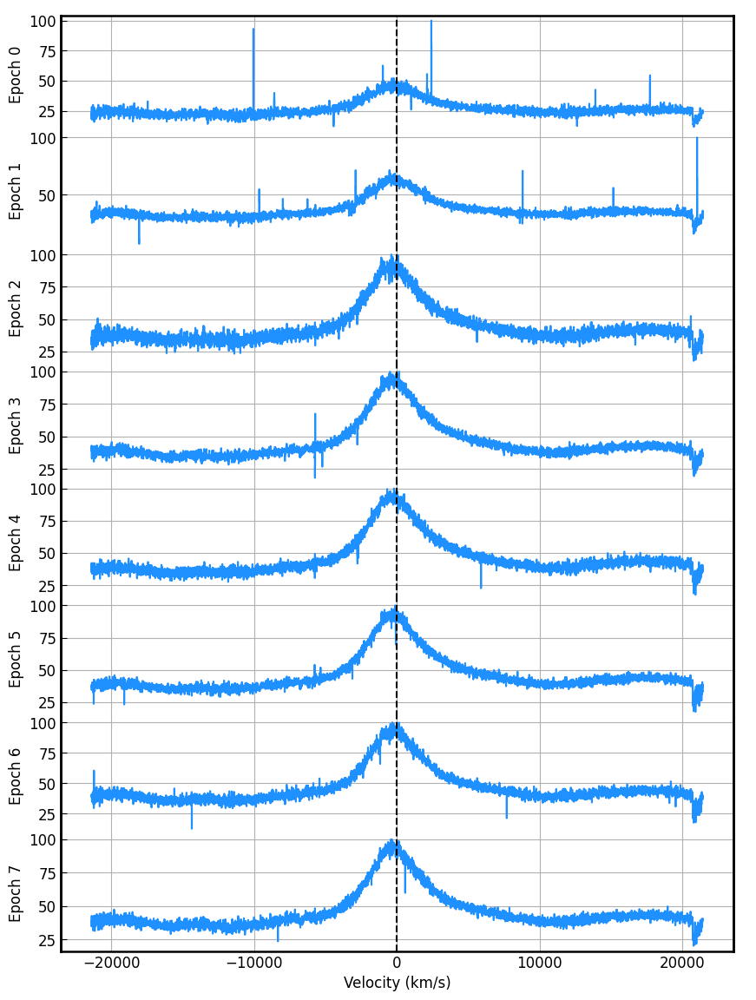

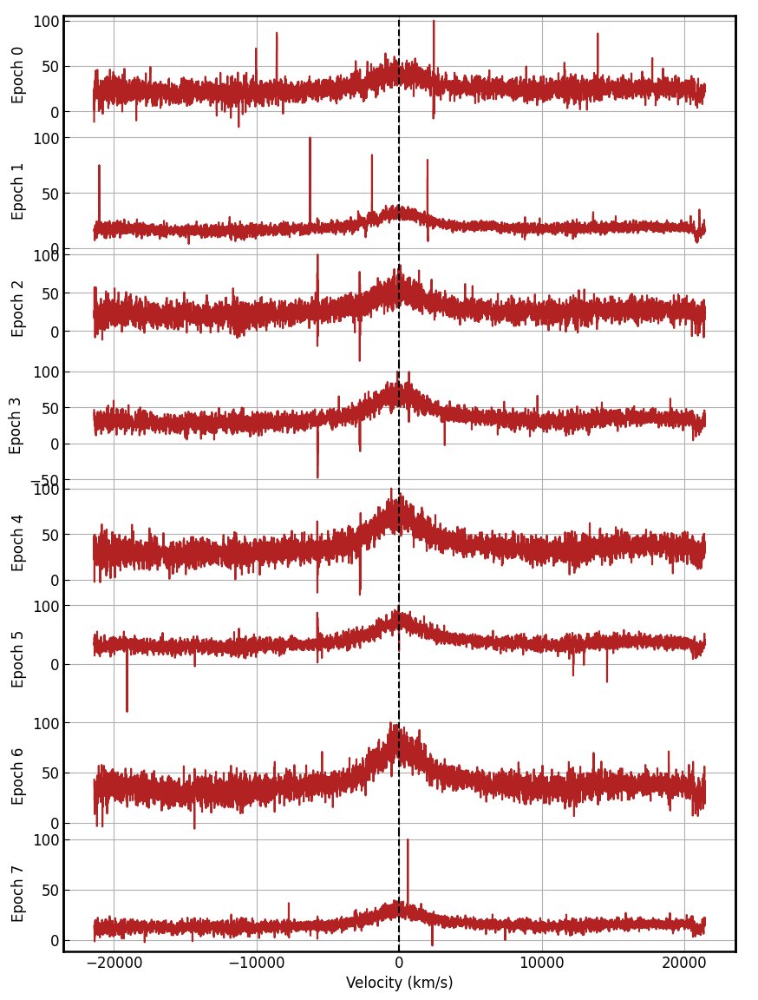

In [6]:
epochs = [0,1,2,3,4,5,6,7]
z = 1.294

# plotting spectra of epochs together
fig_a, axs_a = plt.subplots(nrows=len(epochs), ncols=1, figsize=(10, 14), sharex=True)
fig_b, axs_b = plt.subplots(nrows=len(epochs), ncols=1, figsize=(10, 14), sharex=True)
for i, ep in enumerate(epochs):
    path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')
    data = np.load(os.path.join(f'1D_extracted_COMBINED\epoch{ep}_3PSF_3PSFextract_combined.npy'))
    lam_full = 10 * data[0] /(1+z) 
    flux_a_full = data[1]  
    flux_b_full = data[2]
    # Cut off extreme flux values
    flux_min = -10000
    flux_max = 10000
    flux_mask = (flux_a_full >= flux_min) & (flux_a_full <= flux_max)
    flux_a_filt = flux_a_full[flux_mask]
    flux_b_filt = flux_b_full[flux_mask]
    lam_filt = lam_full[flux_mask]

    mask = (lam_filt >= min(line_wrange) + 100) & (lam_filt <= max(line_wrange) - 100)
    lam = lam_filt[mask]
    velocity = 2.99792e5*(lam - lam_0)/lam_0
    flux_a = flux_a_filt[mask]
    flux_b = flux_b_filt[mask]

    flux_a_norm = flux_a / np.max(flux_a)*100
    flux_b_norm = flux_b / np.max(flux_b)*100

    axs_a[i].step(velocity, flux_a_norm, label='Image A', color='dodgerblue')
    axs_a[i].axvline(x=0, color='black', linestyle='--', linewidth=1.5)

    axs_a[i].set_ylabel(f"Epoch {i}", fontsize=12)
    axs_a[i].grid(True)
    axs_a[i].spines['top'].set_color(None)
    axs_a[i].spines['bottom'].set_color(None)
    axs_a[i].tick_params(axis='both', labelsize=12, bottom = False)

    axs_b[i].step(velocity, flux_b_norm, label='Image A', color='firebrick')
    axs_b[i].axvline(x=0, color='black', linestyle='--', linewidth=1.5)

    axs_b[i].set_ylabel(f"Epoch {i}", fontsize=12)
    axs_b[i].grid(True)
    axs_b[i].spines['top'].set_color(None)
    axs_b[i].spines['bottom'].set_color(None)
    axs_b[i].tick_params(axis='both', labelsize=12, bottom = False)

frame_ax = fig_a.add_subplot(111, frameon=True)
frame_ax.patch.set_facecolor('none') 
frame_ax.tick_params(labelcolor='none', top=False, bottom = False,  left=False, right=False)
frame_ax.grid(False)
axs_a[-1].set_xlabel("Velocity (km/s)", fontsize=12)
fig_a.subplots_adjust(hspace=0) 
frame_axb = fig_b.add_subplot(111, frameon=True)
frame_axb.patch.set_facecolor('none')  
frame_axb.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
frame_axb.grid(False)
axs_b[-1].set_xlabel("Velocity (km/s)", fontsize=12)
fig_b.subplots_adjust(hspace=0)
plt.show()



## Affine fitting of image B on image A (B = x * A + y)

Output are the fits of each epoch and plot of residuals

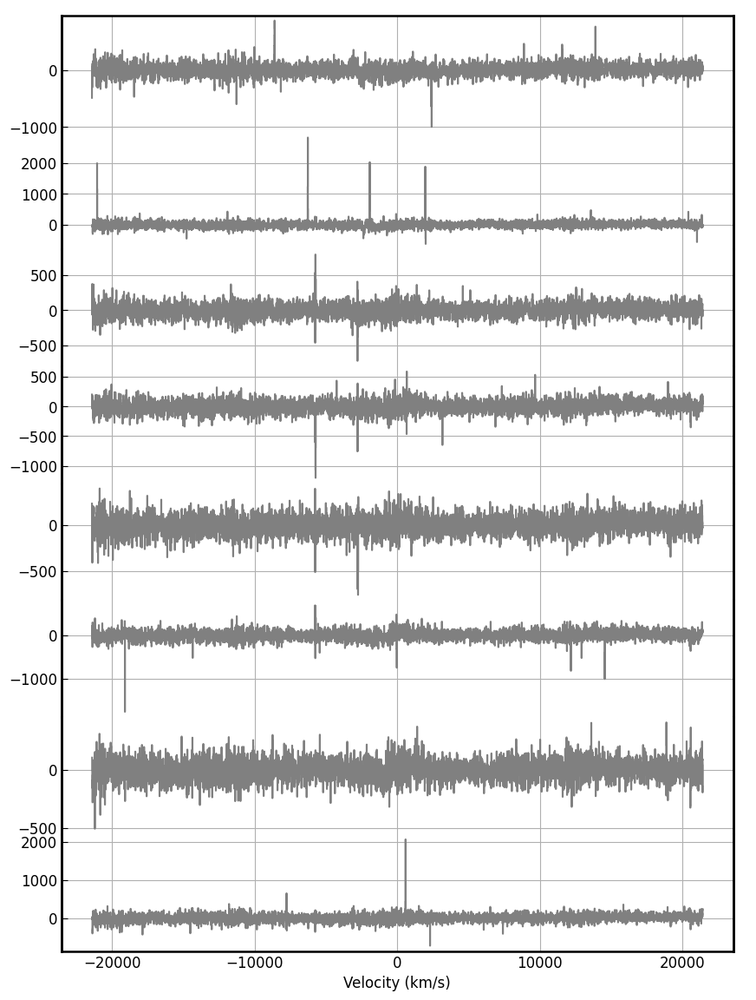

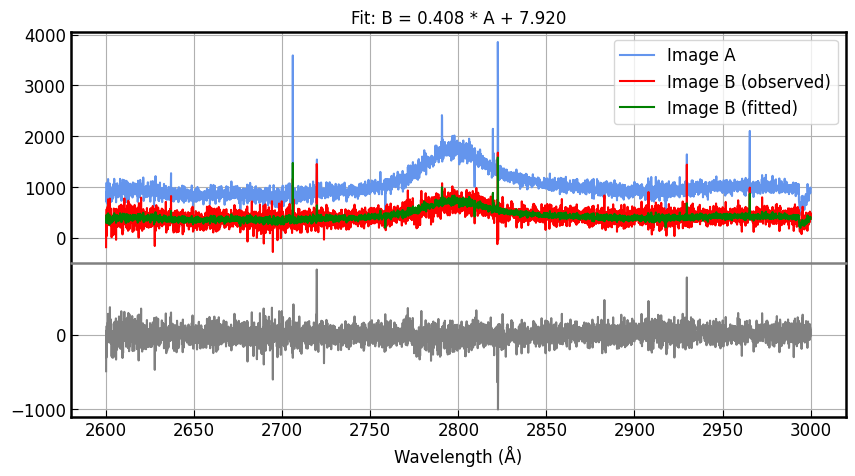

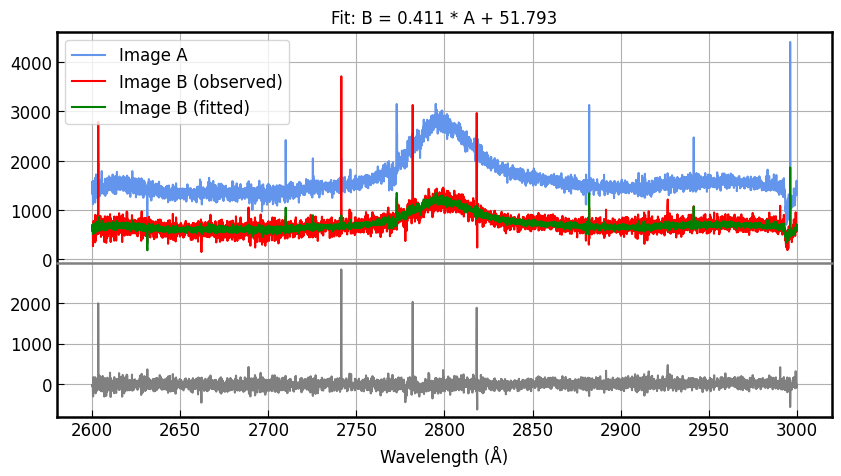

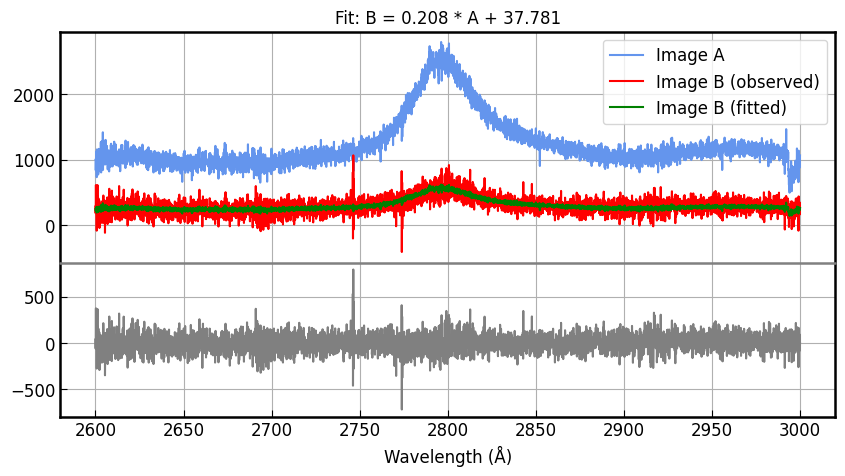

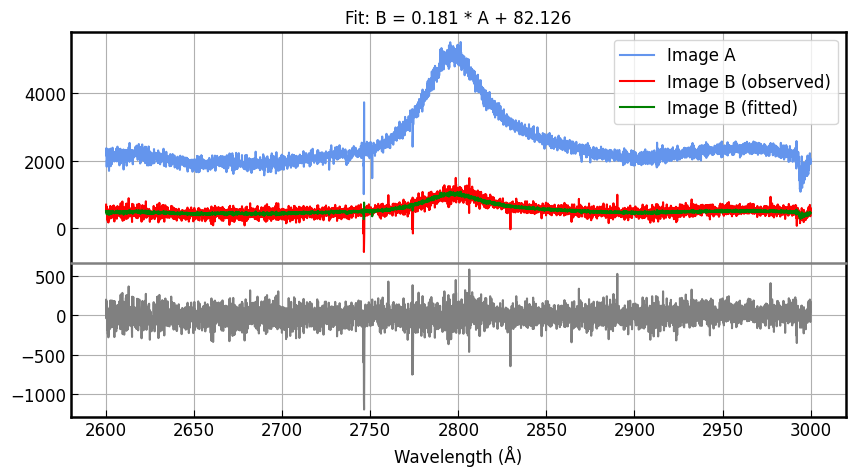

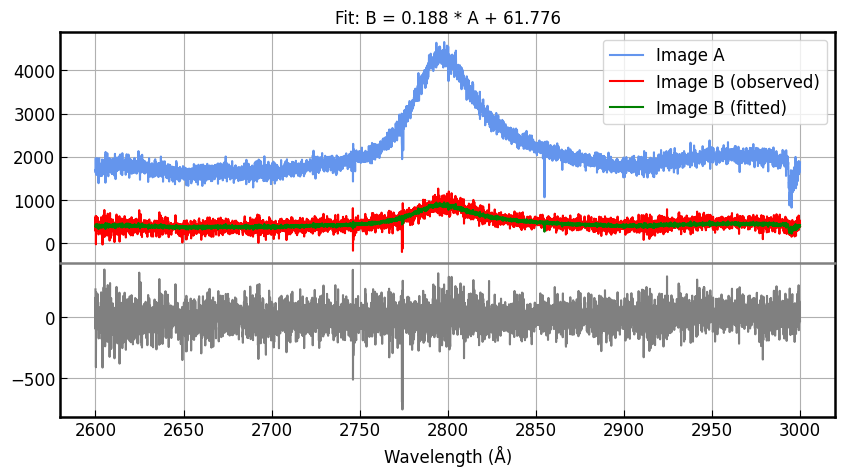

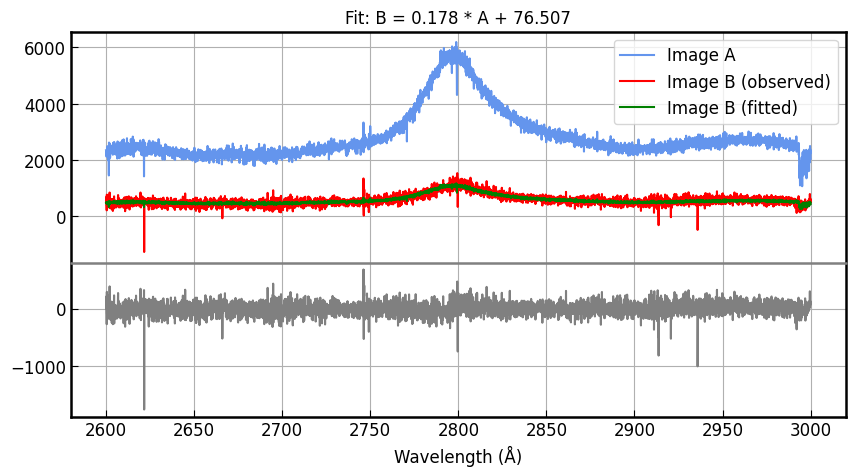

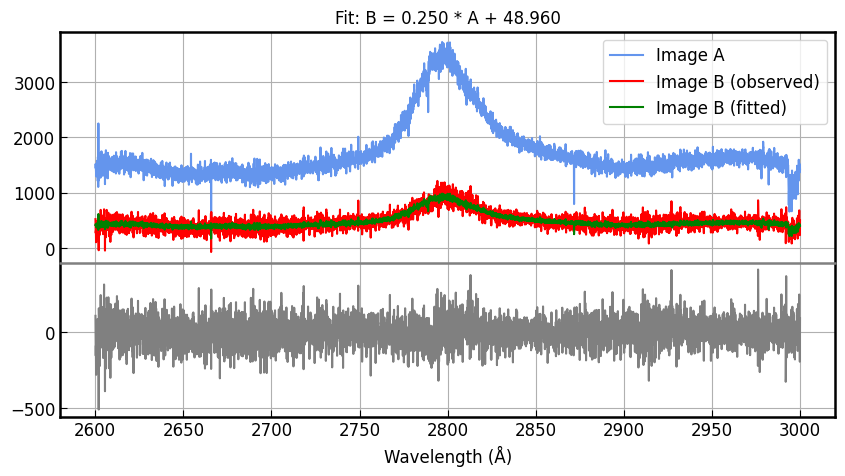

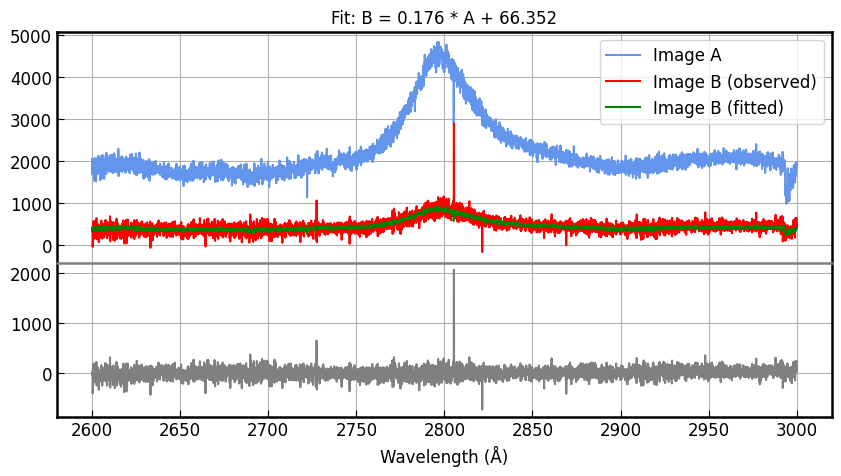

0.027210324652167786


In [7]:
from scipy.optimize import curve_fit
import matplotlib.gridspec as gridspec

epochs = [0,1,2,3,4,5,6,7]
fig_res, ax_res = plt.subplots(nrows=len(epochs), ncols=1, figsize=(10, 14), sharex=True)

shifts = []

for i, ep in enumerate(epochs):
    path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')
    data = np.load(os.path.join(f'1D_extracted_COMBINED\epoch{ep}_3PSF_3PSFextract_combined.npy'))

    lam_full = 10 * data[0] /(1+z) 
    flux_a_full = data[1]  
    flux_b_full = data[2]
    # Cut off extreme flux values
    flux_min = -10000
    flux_max = 10000
    flux_mask = (flux_a_full >= flux_min) & (flux_a_full <= flux_max)
    flux_a_filt = flux_a_full[flux_mask]
    flux_b_filt = flux_b_full[flux_mask]
    lam_filt = lam_full[flux_mask]

    mask = (lam_filt >= min(line_wrange) + 100) & (lam_filt <= max(line_wrange) - 100)
    lam = lam_filt[mask]
    flux_a = flux_a_filt[mask]
    flux_b = flux_b_filt[mask]
    velocity = 2.99792e5*(lam - lam_0)/lam_0

    def model(A, x, y):
        return x * A + y

    # Fit model
    popt, pcov = curve_fit(model, flux_a, flux_b)
    x_fit, y_fit = popt

    flux_b_fit = model(flux_a, x_fit, y_fit)
    residuals = flux_b - flux_b_fit

    # Plot only residuals of all epochs
    ax_res[i].step(velocity, residuals, color = 'grey', label = 'Residuals')
    ax_res[i].grid(True)
    ax_res[i].tick_params(axis='both', labelsize=12, bottom = False)
    ax_res[i].spines['top'].set_color(None)
    ax_res[i].spines['bottom'].set_color(None)

    # Plot Fits
    fig = plt.figure(figsize=(10, 5))
    gs = gridspec.GridSpec(3, 1, height_ratios=[1.5, 0, 1])  

    # Subplots with different heights
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[2], sharex=ax1)

    # Plotting
    ax1.plot(lam, flux_a, label='Image A', color='cornflowerblue')
    ax1.plot(lam, flux_b, label='Image B (observed)', color='red')
    ax1.plot(lam, flux_b_fit, label='Image B (fitted)', color='green')
    ax2.plot(lam, residuals, color='gray', label='Residuals')

    ax1.set_title(f"Fit: B = {x_fit:.3f} * A + {y_fit:.3f}", fontsize = 12)
    ax2.set_xlabel("Wavelength (Å)", fontsize=12)
    ax1.tick_params(axis='both', labelsize=12, bottom = False)
    ax2.tick_params(axis='both', labelsize=12)
    fig.subplots_adjust(hspace=0)
    ax1.grid(True)
    ax1.legend(fontsize = 12)
    ax2.grid(True)
    ax1.spines['bottom'].set_color(None)
    ax2.spines['top'].set_color('grey')
    plt.setp(ax1.get_xticklabels(), visible=False)

    # Calculate percentage of vertical shift
    mean_flux = np.mean(flux_a)
    shift = y_fit/mean_flux
    shifts.append(shift)

frame_ax = fig_res.add_subplot(111, frameon=True)
frame_ax.patch.set_facecolor('none') 
frame_ax.tick_params(labelcolor='none', top=False, bottom = False,  left=False, right=False)
frame_ax.grid(False)
ax_res[-1].set_xlabel("Velocity (km/s)", fontsize=12)
fig_res.subplots_adjust(hspace=0) 
plt.show()

print(np.mean(shifts))

Example use of  the PyQSO fit code for one eopch (with explanations for each line)

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_op_norm          0        0    1e+10     None    False     None     None
Fe_op_shift         0    -0.01     0.01     None    False     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_uv_norm          0        0    1e+10     None    False     None     None
Fe_uv_shift         0    -0.01     0.01     None    False     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_slope         -1.5       -5        3     None     True     None     None
conti_a_0           0     -inf      inf     None     True     None     None
conti_a_1 

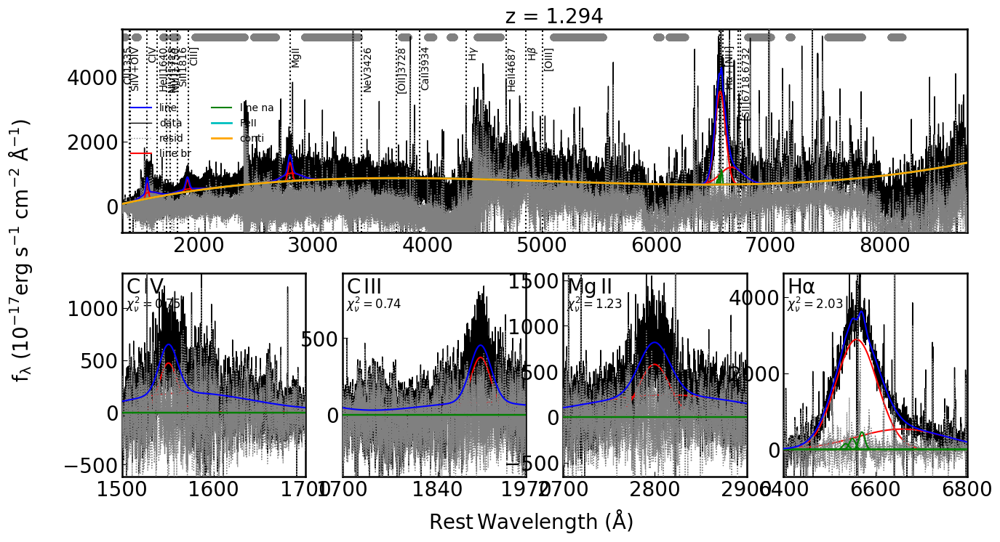

In [8]:
path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')

# Requried
data = np.load("1D_extracted_COMBINED\epoch0_3PSF_3PSFextract_combined.npy")
#data = [wavelength_concatenated, image_a_concatenated, image_b_concatenated, galaxy_concatenated, uncs_a_concatenated,
#        uncs_b_concatenated, uncs_g_concatenated, sky_concatenated, uncs_sky_concatenated]

lam = 10 * data[0]  # OBS wavelength [A]
flux_a = data[1]  # OBS flux for image A [erg/s/cm^2/A]
flux_b = data[2] #OBS flux for image B [erg/s/cm^2/A]
err_a = data[4]  # 1 sigma error for image A
err_b = data[5]  # 1 sigma error for image B

# Optional
#ra = 180 # RA
#dec = 23  # DEC
#plateid = 123  # SDSS plate ID
#mjd = 1837  # SDSS MJD
#fiberid = 321  # SDSS fiber ID
# Prepare data
q_mle = QSOFit(lam, flux_b, err_b, z, path=path_ex)

start = timeit.default_timer()
# Do the fitting

q_mle.Fit(name=None,  # customize the name of given targets. Default: plate-mjd-fiber
          # prepocessing parameters
          nsmooth=1,  # do n-pixel smoothing to the raw input flux and err spectra
          and_mask=False,  # delete the and masked pixels
          or_mask=False,  # delete the or masked pixels
          reject_badpix=True,  # reject 10 most possible outliers by the test of pointDistGESD
          deredden=True,  # correct the Galactic extinction
          wave_range=None,  # trim input wavelength
          wave_mask=None,  # 2-D array, mask the given range(s)

          # host decomposition parameters
          decompose_host=False,  # If True, the host galaxy-QSO decomposition will be applied
          host_prior=False, # If True, the code will adopt prior-informed method to assist decomposition. Currently, only 'CZBIN1' and 'DZBIN1' model for QSO PCA are available. And the model for galaxy must be PCA too.
          host_prior_scale=0.2, # scale of prior panelty. Usually, 0.2 works fine for SDSS spectra. Adjust it smaller if you find the prior affect the fitting results too much.

          host_line_mask=True, # If True, the line region of galaxy will be masked when subtracted from original spectra.
          decomp_na_mask=True, # If True, the narrow line region will be masked when perform decomposition
          qso_type='CZBIN1', # PCA template name for quasar
          npca_qso=10, # numebr of quasar templates
          host_type='PCA', # template name for galaxy
          npca_gal=5, # number of galaxy templates
          
          # continuum model fit parameters
          Fe_uv_op=False,  # If True, fit continuum with UV and optical FeII template
          poly=True,  # If True, fit continuum with the polynomial component to account for the dust reddening
          BC=False,  # If True, fit continuum with Balmer continua from 1000 to 3646A
          initial_guess=None,  # Initial parameters for continuum model, read the annotation of this function for detail
          rej_abs_conti=False,  # If True, it will iterately reject 3 sigma outlier absorption pixels in the continuum
          n_pix_min_conti=100,  # Minimum number of negative pixels for host continuuum fit to be rejected.

          # emission line fit parameters
          linefit=True,  # If True, the emission line will be fitted
          rej_abs_line=False,
          # If True, it will iterately reject 3 sigma outlier absorption pixels in the emission lines

          # fitting method selection
          MC=False,
          # If True, do Monte Carlo resampling of the spectrum based on the input error array to produce the MC error array
          MCMC=False,
          # If True, do Markov Chain Monte Carlo sampling of the posterior probability densities to produce the error array
          nsamp=200,
          # The number of trials of the MC process (if MC=True) or number samples to run MCMC chain (if MCMC=True)

          # advanced fitting parameters
          param_file_name='qsopar.fits',  # Name of the qso fitting parameter FITS file.
          nburn=20,  # The number of burn-in samples to run MCMC chain
          nthin=10,  # To set the MCMC chain returns every n samples
          epsilon_jitter=0.,
          # Initial jitter for every initial guass to avoid local minimum. (Under test, not recommanded to change)

          # customize the results
          save_result=False,  # If True, all the fitting results will be saved to a fits file
          save_fits_name=None,  # The output name of the result fits
          save_fits_path=path_out,  # The output path of the result fits
          plot_fig=True,  # If True, the fitting results will be plotted
          save_fig=False,  # If True, the figure will be saved
          plot_corner=True,  # Whether or not to plot the corner plot results if MCMC=True

          # debugging mode
          verbose=True,  # turn on (True) or off (False) debugging output

          # sublevel parameters for figure plot and emcee
          kwargs_plot={
              'save_fig_path': '.',  # The output path of the figure
              'broad_fwhm'   : 1200  # km/s, lower limit that code decide if a line component belongs to broad component
          },
          kwargs_conti_emcee={},
          kwargs_line_emcee={})

end = timeit.default_timer()

print(f'Fitting finished in {np.round(end - start, 1)}s')

## Data preparation for line fitting

Create sets of data for each epoch, for image A and B and then store parameters of each fit into 2 dictionaries: one containing FeII template fits, one without it

In [10]:
epochs = [0,1,2,3,4,5,6,7]

lam = []
flux_a = []
flux_b = []
err_a = []
err_b = []

for ep in epochs:
    path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')
    data = np.load(os.path.join(f'1D_extracted_COMBINED\epoch{ep}_3PSF_3PSFextract_combined.npy'))
    
    lam.append(10 * data[0])  
    flux_a.append(data[1])  
    flux_b.append(data[2]) 
    err_a.append(data[4])  
    err_b.append(data[5])

In [11]:
import re
import numpy as np
import os
from contextlib import redirect_stdout
from IPython.utils import io
from IPython.display import display
import io as io_mod

epochs = [0,1,2,3,4,5,6,7]

# Quick way to use fit function to retrieve parameters. Free settings for dataset to use, wavelength range, FeII and plotting the images of the fit
def output_param(lam, flux, err, w_range, Fe_line, plot_figure):
    q_mle = QSOFit(lam, flux, err, z, path=path_ex)
    return q_mle.Fit(name=None, nsmooth=1, and_mask=False, or_mask=False, reject_badpix=True, deredden=True, wave_range=w_range, wave_mask=None, 
              decompose_host=False, host_prior=False, host_prior_scale=0.2, host_line_mask=True, decomp_na_mask=True,  qso_type='CZBIN1',  npca_qso=10, host_type='PCA', npca_gal=5, 
              Fe_uv_op=Fe_line, poly=True, BC=False, initial_guess=None, rej_abs_conti=False, n_pix_min_conti=100,  
              linefit=True, rej_abs_line=False, MC=False, MCMC=False, nsamp=200, param_file_name='qsopar.fits', nburn=20, nthin=10, epsilon_jitter=0.,
              save_result=False,  save_fits_name=None, save_fits_path=path_out, plot_fig=plot_figure, save_fig=False, plot_corner=True, verbose=True,  
              kwargs_plot={
                  'save_fig_path': '.',  
                  'broad_fwhm'   : 1200  
              },
              kwargs_conti_emcee={},
              kwargs_line_emcee={})

#Image A
params_a_Fe = {}

for ep in range(len(epochs)):
    buf = io_mod.StringIO()
    with redirect_stdout(buf):
        output_param(lam[ep], flux_a[ep], err_a[ep], line_wrange, True, False)
    output_text = buf.getvalue()

    # line parameter for broad components
    pattern1 = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    pattern2 = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    matches1 = re.findall(pattern1, output_text)
    matches2 = re.findall(pattern2, output_text)
    if matches1== []:
        pattern1_nounc = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches1 = re.findall(pattern1_nounc, output_text)
        for i in range(len(matches1)):
            matches1[i] = matches1[i] + (0.0,)
    if matches2 == []:
        pattern2_nounc = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches2 = re.findall(pattern2_nounc, output_text)
        for i in range(len(matches2)):
            matches2[i] = matches2[i] + (0.0,)
    br_par1 = []
    br_par2 = []

    for name, value, unc in matches1:
        if name == 'dwave' or name == 'sigma':
            br_par1.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par1.append((float(value), float(unc)))
    
    for name, value, unc in matches2:
        if name == 'dwave' or name == 'sigma':
            br_par2.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par2.append((float(value), float(unc)))

    # Assign gaussian with smaller centerwave to be 1 and bigger to be 2 ("blue" and "red")
    dwave_1 = br_par1[1][0]
    dwave_2 = br_par2[1][0]
    if dwave_1 < dwave_2:
        br_1 = br_par1
        br_2 = br_par2
    else:
        br_1 = br_par2
        br_2 = br_par1

    fwhm_1 = (br_1[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_1[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
    fwhm_2 = (br_2[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_2[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)

    br_1.append(fwhm_1)
    br_2.append(fwhm_2)

    # If narrow == True, include the narrow component's parameters
    if narrow == True:
        pattern_na = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
        matches_na = re.findall(pattern_na, output_text)
        if matches_na == []:
            pattern_na_nounc = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
            matches_na = re.findall(pattern_na_nounc, output_text)
            for i in range(len(matches_na)):
                matches_na[i] = matches_na[i] + (0.0,)
        na_par = []

        for name, value, unc in matches_na:
            if name == 'dwave' or name == 'sigma':
                na_par.append((float(value)*lam_0, float(unc)*lam_0)) 
            else:
                na_par.append((float(value), float(unc)))
        
        fwhm_na = (na_par[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, na_par[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
        na_par.append(fwhm_na)

    # continuum parameters
    conti_pattern = r"\[\[Variables\]\](.*?)\[\[Correlations\]\]"
    corr_pattern = r"\[\[Correlations\]\](.*?)(?:\n\s*\n|$)"
    param_pattern = r"([a-zA-Z0-9_]+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"

    conti_block = re.search(conti_pattern, output_text, re.DOTALL)
    conti_corr_block = re.search(corr_pattern, output_text, re.DOTALL)

    conti_dict = {}
    conti_corrs = {}
    param_corrs = {}

    if conti_block:
        matches = re.findall(param_pattern, conti_block.group(1))
        for name, val, err in matches:
            if not name.startswith(rf"{line_name}_br_"):
                conti_dict[name] = (float(val), float(err))

    if conti_corr_block:
        corr_lines = conti_corr_block.group(1).strip().split('\n')
        for line in corr_lines:
            if ':' in line:
                continue 
            match = re.match(r'\s*C\((.+?),\s*(.+?)\)\s*=\s*([+-]?[0-9.]+)', line.strip())
            if match:
                var1, var2, coeff = match.groups()
                coeff = float(coeff)
                # Separate continuum and line parameter correlations
                if not (var1.startswith(rf"{line_name}_br_") or var2.startswith(rf"{line_name}_br_")):
                    conti_corrs[(var1.strip(), var2.strip())] = coeff
                else:
                    param_corrs[(var1.strip(), var2.strip())] = coeff

    if narrow == True:
        params_a_Fe[os.path.join(f'epoch{ep}')] = {
        "br_1": br_1,
        "br_2": br_2,
        "na": na_par,
        "conti_fit": conti_dict,
        "conti_corr": conti_corrs,
        "param_corr": param_corrs
        }
    else:
        params_a_Fe[os.path.join(f'epoch{ep}')] = {
            "br_1": br_1,
            "br_2": br_2,
            "conti_fit": conti_dict,
            "conti_corr": conti_corrs,
            "param_corr": param_corrs
        }

print(params_a_Fe)


# image B
params_b_Fe = {}

for ep in range(len(epochs)):
    buf = io_mod.StringIO()
    with redirect_stdout(buf):
        output_param(lam[ep], flux_b[ep], err_b[ep], line_wrange, True, False)
    output_text = buf.getvalue()
    pattern1 = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    pattern2 = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    matches1 = re.findall(pattern1, output_text)
    matches2 = re.findall(pattern2, output_text)
    if matches1== []:
        pattern1_nounc = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches1 = re.findall(pattern1_nounc, output_text)
        for i in range(len(matches1)):
            matches1[i] = matches1[i] + (0.0,)
    if matches2 == []:
        pattern2_nounc = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches2 = re.findall(pattern2_nounc, output_text)
        for i in range(len(matches2)):
            matches2[i] = matches2[i] + (0.0,)
    br_par1 = []
    br_par2 = []
    for name, value, unc in matches1:
        if name == 'dwave' or name == 'sigma':
            br_par1.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par1.append((float(value), float(unc)))
    for name, value, unc in matches2:
        if name == 'dwave' or name == 'sigma':
            br_par2.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par2.append((float(value), float(unc)))          

    dwave_1 = br_par1[1][0]
    dwave_2 = br_par2[1][0]
    if dwave_1 < dwave_2:
        br_1 = br_par1
        br_2 = br_par2
    else:
        br_1 = br_par2
        br_2 = br_par1
    fwhm_1 = (br_1[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_1[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
    fwhm_2 = (br_2[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_2[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
    br_1.append(fwhm_1)
    br_2.append(fwhm_2)

    # If narrow == True, include the narrow component's parameters
    if narrow == True:
        pattern_na = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
        matches_na = re.findall(pattern_na, output_text)
        if matches_na == []:
            pattern_na_nounc = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
            matches_na = re.findall(pattern_na_nounc, output_text)
            for i in range(len(matches_na)):
                matches_na[i] = matches_na[i] + (0.0,)
        na_par = []

        for name, value, unc in matches_na:
            if name == 'dwave' or name == 'sigma':
                na_par.append((float(value)*lam_0, float(unc)*lam_0)) 
            else:
                na_par.append((float(value), float(unc)))
        
        fwhm_na = (na_par[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, na_par[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
        na_par.append(fwhm_na)
    
    conti_pattern = r"\[\[Variables\]\](.*?)\[\[Correlations\]\]"
    corr_pattern = r"\[\[Correlations\]\](.*?)(?:\n\s*\n|$)"
    param_pattern = r"([a-zA-Z0-9_]+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    conti_block = re.search(conti_pattern, output_text, re.DOTALL)
    conti_corr_block = re.search(corr_pattern, output_text, re.DOTALL)
    conti_dict = {}
    conti_corrs = {}
    param_corrs = {}
    if conti_block:
        matches = re.findall(param_pattern, conti_block.group(1))
        for name, val, err in matches:
            if not name.startswith(rf"{line_name}_br_"):
                conti_dict[name] = (float(val), float(err))
    if conti_corr_block:
        corr_lines = conti_corr_block.group(1).strip().split('\n')
        for line in corr_lines:
            if ':' in line:
                continue  
            match = re.match(r'\s*C\((.+?),\s*(.+?)\)\s*=\s*([+-]?[0-9.]+)', line.strip())
            if match:
                var1, var2, coeff = match.groups()
                coeff = float(coeff)
                if not (var1.startswith(rf"{line_name}_br_") or var2.startswith(rf"{line_name}_br_")):
                    conti_corrs[(var1.strip(), var2.strip())] = coeff
                else:
                    param_corrs[(var1.strip(), var2.strip())] = coeff
    
    if narrow == True:
        params_b_Fe[os.path.join(f'epoch{ep}')] = {
        "br_1": br_1,
        "br_2": br_2,
        "na": na_par,
        "conti_fit": conti_dict,
        "conti_corr": conti_corrs,
        "param_corr": param_corrs
        }
    else:
        params_b_Fe[os.path.join(f'epoch{ep}')] = {
            "br_1": br_1,
            "br_2": br_2,
            "conti_fit": conti_dict,
            "conti_corr": conti_corrs,
            "param_corr": param_corrs
        }

print(params_b_Fe)


# image without FeII
params_a = {}

for ep in range(len(epochs)):
    buf = io_mod.StringIO()
    with redirect_stdout(buf):
        output_param(lam[ep], flux_a[ep], err_a[ep], line_wrange, False, False)
    output_text = buf.getvalue()
    pattern1 = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    pattern2 = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    matches1 = re.findall(pattern1, output_text)
    matches2 = re.findall(pattern2, output_text)
    if matches1== []:
        pattern1_nounc = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches1 = re.findall(pattern1_nounc, output_text)
        for i in range(len(matches1)):
            matches1[i] = matches1[i] + (0.0,)
    if matches2 == []:
        pattern2_nounc = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches2 = re.findall(pattern2_nounc, output_text)
        for i in range(len(matches2)):
            matches2[i] = matches2[i] + (0.0,)
    br_par1 = []
    br_par2 = []
    for name, value, unc in matches1:
        if name == 'dwave' or name == 'sigma':
            br_par1.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par1.append((float(value), float(unc)))
    for name, value, unc in matches2:
        if name == 'dwave' or name == 'sigma':
            br_par2.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par2.append((float(value), float(unc)))
    dwave_1 = br_par1[1][0]
    dwave_2 = br_par2[1][0]
    if dwave_1 < dwave_2:
        br_1 = br_par1
        br_2 = br_par2
    else:
        br_1 = br_par2
        br_2 = br_par1
    fwhm_1 = (br_1[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_1[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
    fwhm_2 = (br_2[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_2[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
    br_1.append(fwhm_1)
    br_2.append(fwhm_2)

    # If narrow == True, include the narrow component's parameters
    if narrow == True:
        pattern_na = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
        matches_na = re.findall(pattern_na, output_text)
        if matches_na == []:
            pattern_na_nounc = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
            matches_na = re.findall(pattern_na_nounc, output_text)
            for i in range(len(matches_na)):
                matches_na[i] = matches_na[i] + (0.0,)
        na_par = []

        for name, value, unc in matches_na:
            if name == 'dwave' or name == 'sigma':
                na_par.append((float(value)*lam_0, float(unc)*lam_0)) 
            else:
                na_par.append((float(value), float(unc)))
        
        fwhm_na = (na_par[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, na_par[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
        na_par.append(fwhm_na)

    conti_pattern = r"\[\[Variables\]\](.*?)\[\[Correlations\]\]"
    corr_pattern = r"\[\[Correlations\]\](.*?)(?:\n\s*\n|$)"
    param_pattern = r"([a-zA-Z0-9_]+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    conti_block = re.search(conti_pattern, output_text, re.DOTALL)
    conti_corr_block = re.search(corr_pattern, output_text, re.DOTALL)
    conti_dict = {}
    conti_corrs = {}
    param_corrs = {}
    if conti_block:
        matches = re.findall(param_pattern, conti_block.group(1))
        for name, val, err in matches:
            if not name.startswith(rf"{line_name}_br_"):
                conti_dict[name] = (float(val), float(err))
    if conti_corr_block:
        corr_lines = conti_corr_block.group(1).strip().split('\n')
        for line in corr_lines:
            if ':' in line:
                continue 
            match = re.match(r'\s*C\((.+?),\s*(.+?)\)\s*=\s*([+-]?[0-9.]+)', line.strip())
            if match:
                var1, var2, coeff = match.groups()
                coeff = float(coeff)
                if not (var1.startswith(rf"{line_name}_br_") or var2.startswith(rf"{line_name}_br_")):
                    conti_corrs[(var1.strip(), var2.strip())] = coeff
                else:
                    param_corrs[(var1.strip(), var2.strip())] = coeff
    if narrow == True:
        params_a[os.path.join(f'epoch{ep}')] = {
        "br_1": br_1,
        "br_2": br_2,
        "na": na_par,
        "conti_fit": conti_dict,
        "conti_corr": conti_corrs,
        "param_corr": param_corrs
        }
    else:
        params_a[os.path.join(f'epoch{ep}')] = {
            "br_1": br_1,
            "br_2": br_2,
            "conti_fit": conti_dict,
            "conti_corr": conti_corrs,
            "param_corr": param_corrs
        }

print(params_a)


# Image B without FeII
params_b = {}

for ep in range(len(epochs)):
    buf = io_mod.StringIO()
    with redirect_stdout(buf):
        output_param(lam[ep], flux_b[ep], err_b[ep], line_wrange, False, False)
    output_text = buf.getvalue()
    pattern1 = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    pattern2 = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    matches1 = re.findall(pattern1, output_text)
    matches2 = re.findall(pattern2, output_text)
    if matches1== []:
        pattern1_nounc = rf"{line_name}_br_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches1 = re.findall(pattern1_nounc, output_text)
        for i in range(len(matches1)):
            matches1[i] = matches1[i] + (0.0,)
    if matches2 == []:
        pattern2_nounc = rf"{line_name}_br_2_(\w+):\s*([+-]?[0-9.eE+-]+)"
        matches2 = re.findall(pattern2_nounc, output_text)
        for i in range(len(matches2)):
            matches2[i] = matches2[i] + (0.0,)
    br_par1 = []
    br_par2 = []
    for name, value, unc in matches1:
        if name == 'dwave' or name == 'sigma':
            br_par1.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par1.append((float(value), float(unc)))
    for name, value, unc in matches2:
        if name == 'dwave' or name == 'sigma':
            br_par2.append((float(value)*lam_0, float(unc)*lam_0)) 
        else:
            br_par2.append((float(value), float(unc)))
    dwave_1 = br_par1[1][0]
    dwave_2 = br_par2[1][0]
    if dwave_1 < dwave_2:
        br_1 = br_par1
        br_2 = br_par2
    else:
        br_1 = br_par2
        br_2 = br_par1
    fwhm_1 = (br_1[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_1[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
    fwhm_2 = (br_2[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, br_2[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
    br_1.append(fwhm_1)
    br_2.append(fwhm_2)

    # If narrow == True, include the narrow component's parameters
    if narrow == True:
        pattern_na = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
        matches_na = re.findall(pattern_na, output_text)
        if matches_na == []:
            pattern_na_nounc = rf"{line_name}_na_1_(\w+):\s*([+-]?[0-9.eE+-]+)"
            matches_na = re.findall(pattern_na_nounc, output_text)
            for i in range(len(matches_na)):
                matches_na[i] = matches_na[i] + (0.0,)
        na_par = []

        for name, value, unc in matches_na:
            if name == 'dwave' or name == 'sigma':
                na_par.append((float(value)*lam_0, float(unc)*lam_0)) 
            else:
                na_par.append((float(value), float(unc)))
        
        fwhm_na = (na_par[2][0]*2*(2*np.log(2))**(1/2)*2.9972e5/lam_0, na_par[2][1]*2*np.log(2)**(1/2)*2.9972e5/lam_0)
        na_par.append(fwhm_na)

    conti_pattern = r"\[\[Variables\]\](.*?)\[\[Correlations\]\]"
    corr_pattern = r"\[\[Correlations\]\](.*?)(?:\n\s*\n|$)"
    param_pattern = r"([a-zA-Z0-9_]+):\s*([+-]?[0-9.eE+-]+)\s*\+/-\s*([0-9.eE+-]+)"
    conti_block = re.search(conti_pattern, output_text, re.DOTALL)
    conti_corr_block = re.search(corr_pattern, output_text, re.DOTALL)
    conti_dict = {}
    conti_corrs = {}
    param_corrs = {}
    if conti_block:
        matches = re.findall(param_pattern, conti_block.group(1))
        for name, val, err in matches:
            if not name.startswith(rf"{line_name}_br_"):
                conti_dict[name] = (float(val), float(err))
    if conti_corr_block:
        corr_lines = conti_corr_block.group(1).strip().split('\n')
        for line in corr_lines:
            if ':' in line:
                continue  
            match = re.match(r'\s*C\((.+?),\s*(.+?)\)\s*=\s*([+-]?[0-9.]+)', line.strip())
            if match:
                var1, var2, coeff = match.groups()
                coeff = float(coeff)
                if not (var1.startswith(rf"{line_name}_br_") or var2.startswith(rf"{line_name}_br_")):
                    conti_corrs[(var1.strip(), var2.strip())] = coeff
                else:
                    param_corrs[(var1.strip(), var2.strip())] = coeff
    if narrow == True:
        params_b[os.path.join(f'epoch{ep}')] = {
        "br_1": br_1,
        "br_2": br_2,
        "na": na_par,
        "conti_fit": conti_dict,
        "conti_corr": conti_corrs,
        "param_corr": param_corrs
        }
    else:
        params_b[os.path.join(f'epoch{ep}')] = {
            "br_1": br_1,
            "br_2": br_2,
            "conti_fit": conti_dict,
            "conti_corr": conti_corrs,
            "param_corr": param_corrs
        }

print(params_b)


{'epoch0': {'br_1': [(2077.02973, 123.924216), (-4.538811776, 1.8452081900000001), (15.772589306, 0.857774726), (3976.027997462008, 152.89901466874687)], 'br_2': [(402.57901, 248.49948), (17.780325886, 3.7513960240000004), (11.199200000000001, 1.263465746), (2823.1466555867046, 225.21375575142935)], 'conti_fit': {'Fe_uv_norm': (121.351629, 5.39084049), 'Fe_uv_FWHM': (3601.07859, 318.256801), 'Fe_uv_shift': (0.0012387, 0.00032963), 'PL_norm': (1733.42188, 16.8773889), 'PL_slope': (0.37856805, 143480.789), 'conti_a_0': (-149458.992, 82883000000.0), 'conti_a_1': (3860.39654, 3282996.9), 'conti_a_2': (13.4160819, 223.733656)}, 'conti_corr': {('PL_slope', 'conti_a_0'): -1.0, ('PL_slope', 'conti_a_1'): 1.0, ('conti_a_0', 'conti_a_1'): -1.0, ('conti_a_0', 'conti_a_2'): 1.0, ('PL_slope', 'conti_a_2'): -1.0, ('conti_a_1', 'conti_a_2'): -1.0, ('Fe_uv_norm', 'PL_norm'): -0.9025, ('Fe_uv_norm', 'Fe_uv_FWHM'): 0.661, ('Fe_uv_FWHM', 'PL_norm'): -0.522, ('Fe_uv_shift', 'PL_norm'): 0.3717, ('Fe_uv_shi

### Fitting plots for image A, with FeII

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_op_norm          0        0    1e+10     None    False     None     None
Fe_op_shift         0    -0.01     0.01     None    False     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None     True     None     None
Fe_uv_norm          0        0    1e+10     None     True     None     None
Fe_uv_shift         0    -0.01     0.01     None     True     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_slope         -1.5       -5        3     None     True     None     None
conti_a_0           0     -inf      inf     None     True     None     None
conti_a_1 

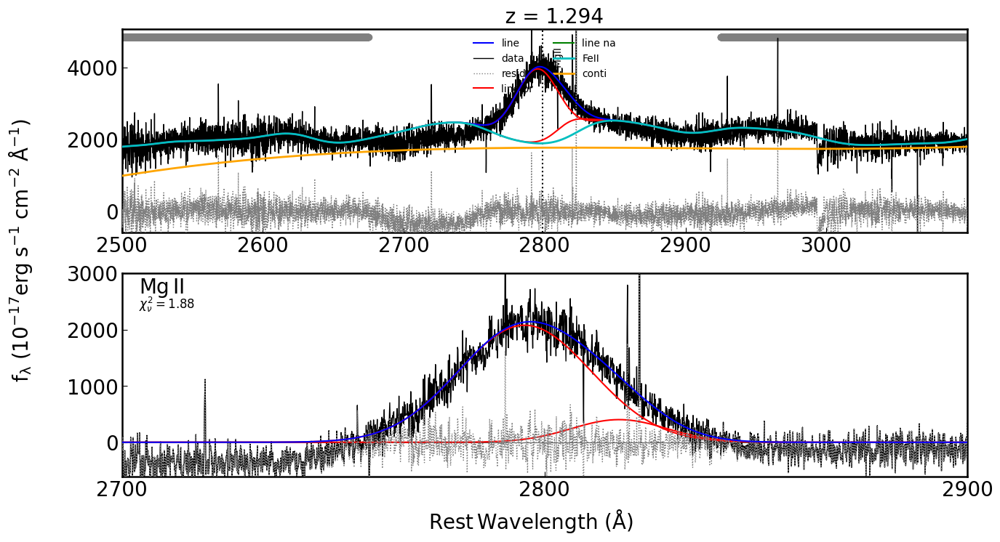

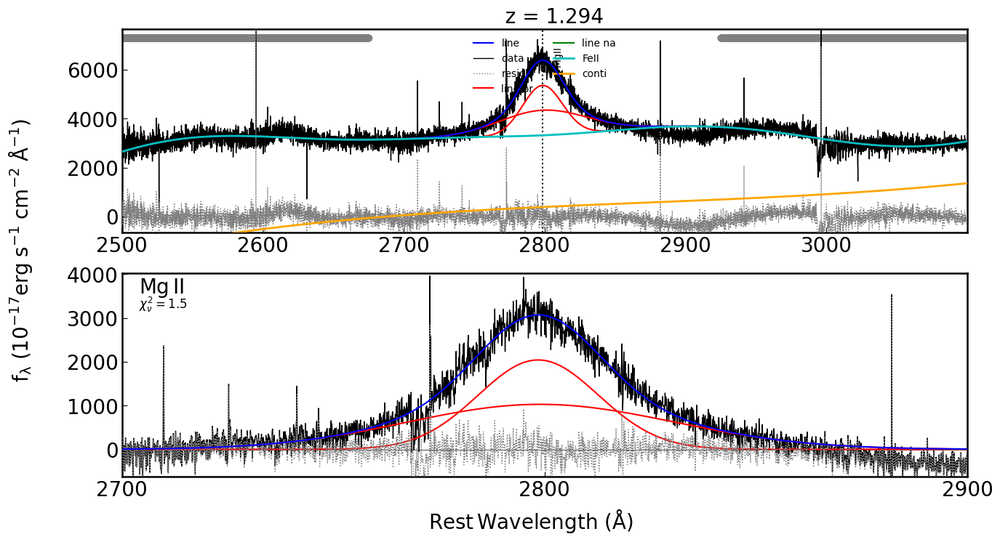

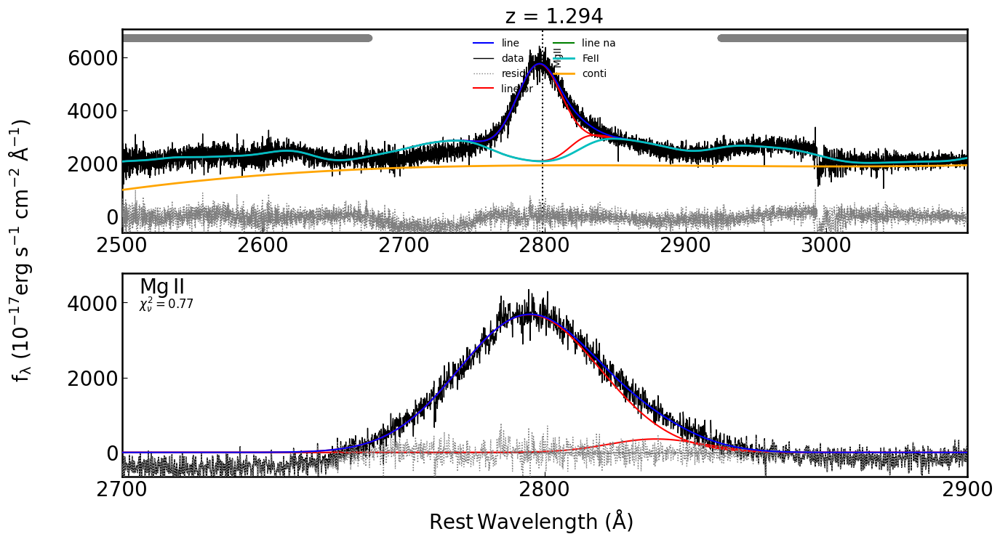

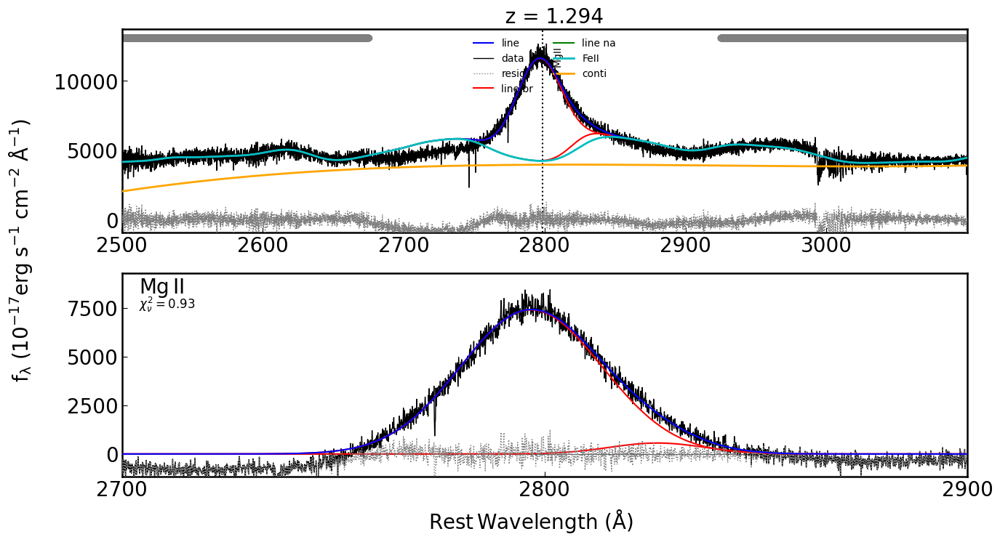

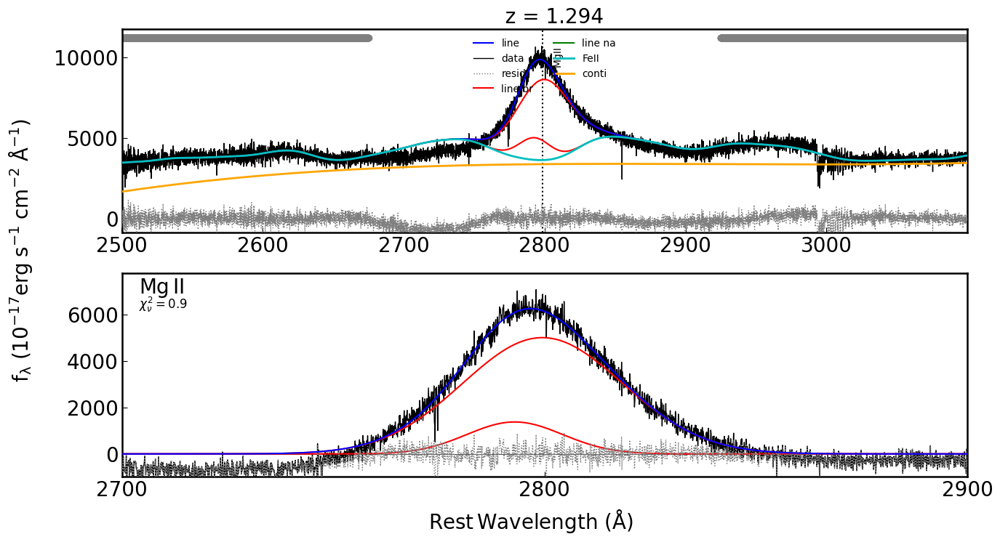

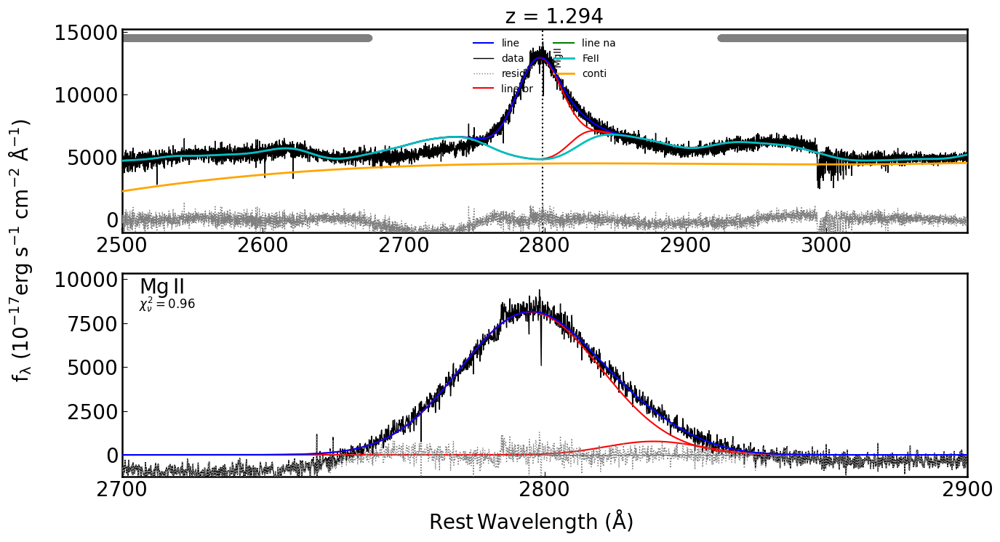

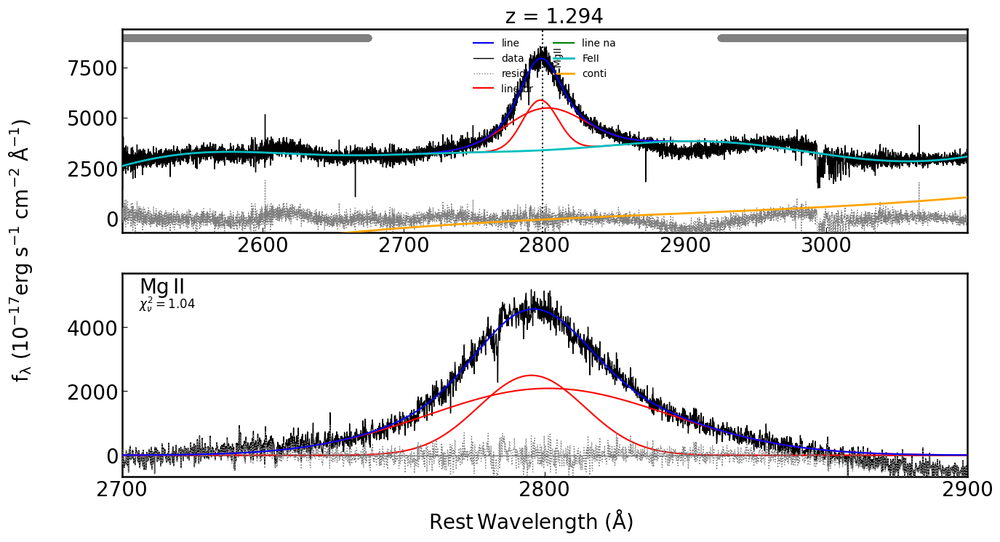

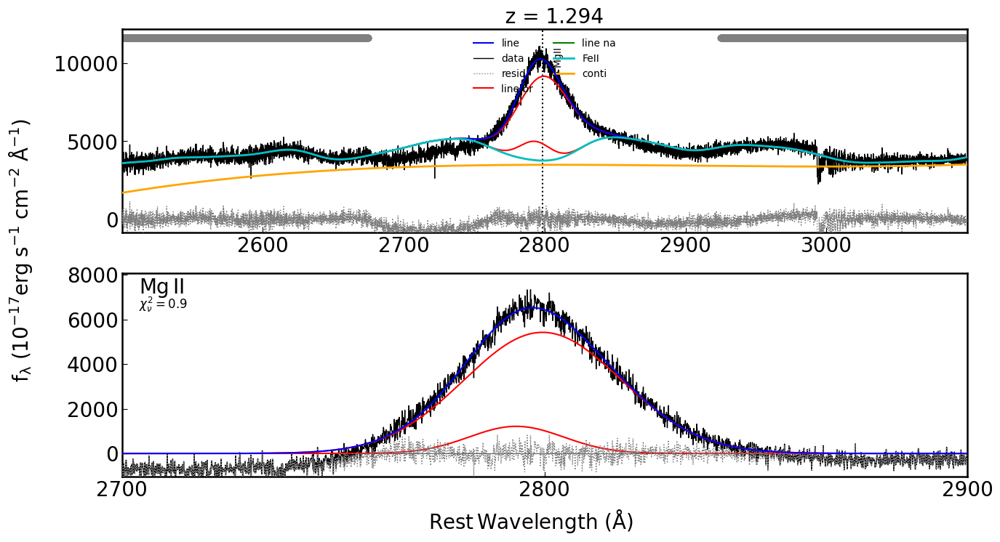

In [12]:
Fe_line = True
w_range = line_wrange
MC_sim = False
MCMC_sim = False
debug = True
epochs =[0,1,2,3,4,5,6,7]

for ep in epochs:
    path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')
    data = np.load(os.path.join(f'1D_extracted_COMBINED\epoch{ep}_3PSF_3PSFextract_combined.npy'))
    
    lam = 10 * data[0]  
    flux_a = data[1]   
    err_a = data[4]     

    q_mle = QSOFit(lam, flux_a, err_a, z, path=path_ex)
    start = timeit.default_timer()
   
    q_mle.Fit(name=None, nsmooth=1, and_mask=False, or_mask=False, reject_badpix=True, deredden=True, wave_range=w_range, wave_mask=None, 
              # host decomposition
              decompose_host=False, host_prior=False, host_prior_scale=0.2, host_line_mask=True, decomp_na_mask=True,  qso_type='CZBIN1',  npca_qso=10, host_type='PCA', npca_gal=5, 
              # continuum model fit parameters
              Fe_uv_op=Fe_line, poly=True, BC=False, initial_guess=None, rej_abs_conti=False, n_pix_min_conti=100,  
              # emission line fit parameters
              linefit=True, rej_abs_line=False,
              # fitting method selection
              MC=MC_sim, MCMC=MCMC_sim, nsamp=200,
              # advanced fitting parameters
              param_file_name='qsopar.fits', nburn=20, nthin=10, epsilon_jitter=0.,
              # customize the results
              save_result=False,  save_fits_name=None, save_fits_path=path_out, plot_fig=True, save_fig=False, plot_corner=True, 
              # debugging mode
              verbose=debug,  
              # sublevel parameters for figure plot and emcee
              kwargs_plot={
                  'save_fig_path': '.',  
                  'broad_fwhm'   : 1200  
              },
              kwargs_conti_emcee={},
              kwargs_line_emcee={})

    end = timeit.default_timer()

    print(f'Fitting finished in {np.round(end - start, 1)}s')

    # Add to dictionary parameters for whole line fit (blue line)
    wh_fwhm, wh_sigma, wh_ew, wh_peak, wh_area, wh_snr = q_mle.line_prop_from_name(rf"{line_name}_br", 'broad')
    params_a_Fe[os.path.join(f'epoch{ep}')]["whole"] = [wh_fwhm, wh_peak - lam_0]

### Image B, with FeII 

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_op_norm          0        0    1e+10     None    False     None     None
Fe_op_shift         0    -0.01     0.01     None    False     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None     True     None     None
Fe_uv_norm          0        0    1e+10     None     True     None     None
Fe_uv_shift         0    -0.01     0.01     None     True     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_slope         -1.5       -5        3     None     True     None     None
conti_a_0           0     -inf      inf     None     True     None     None
conti_a_1 

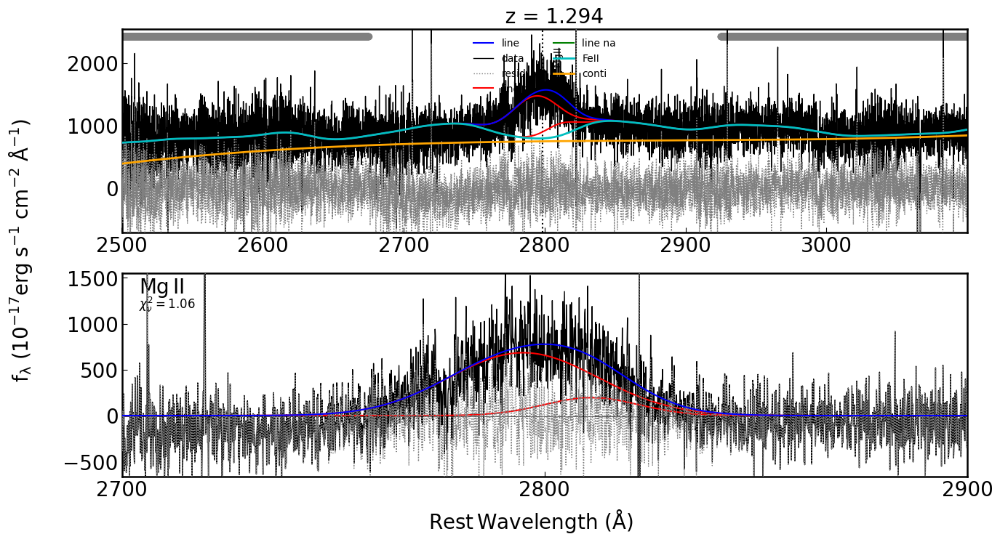

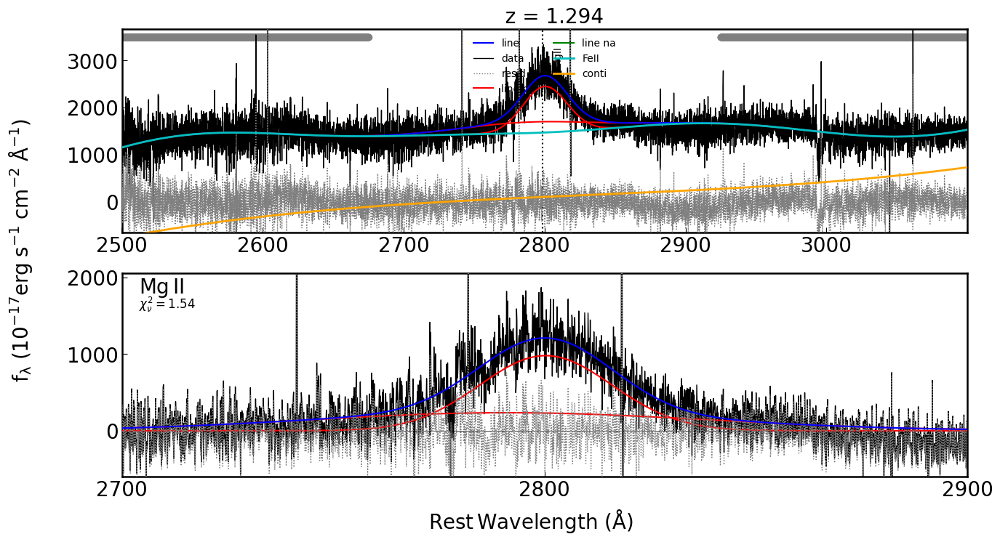

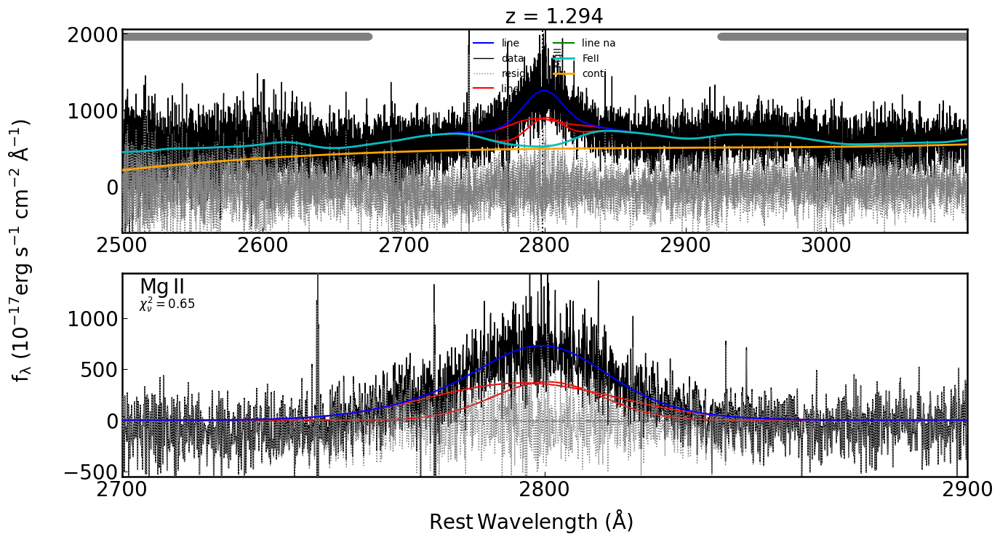

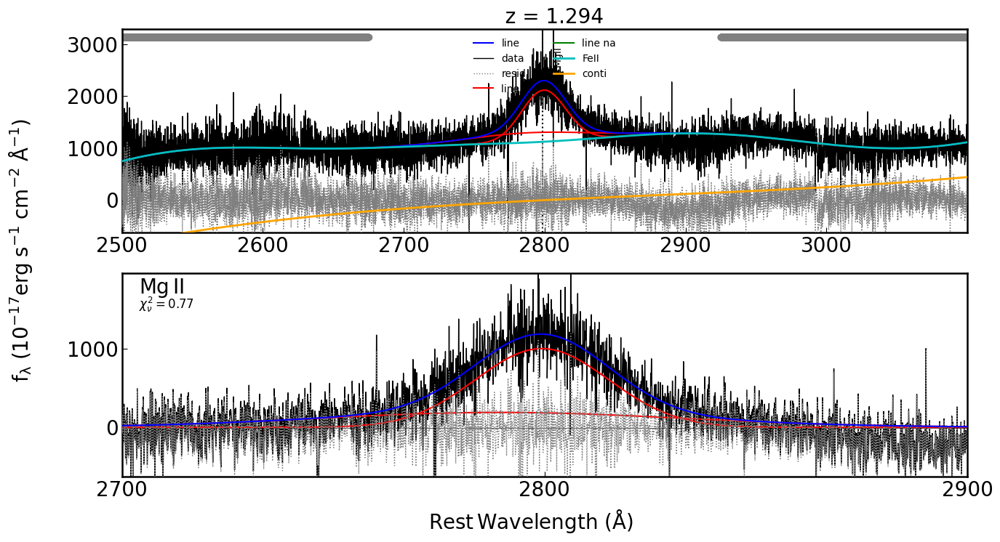

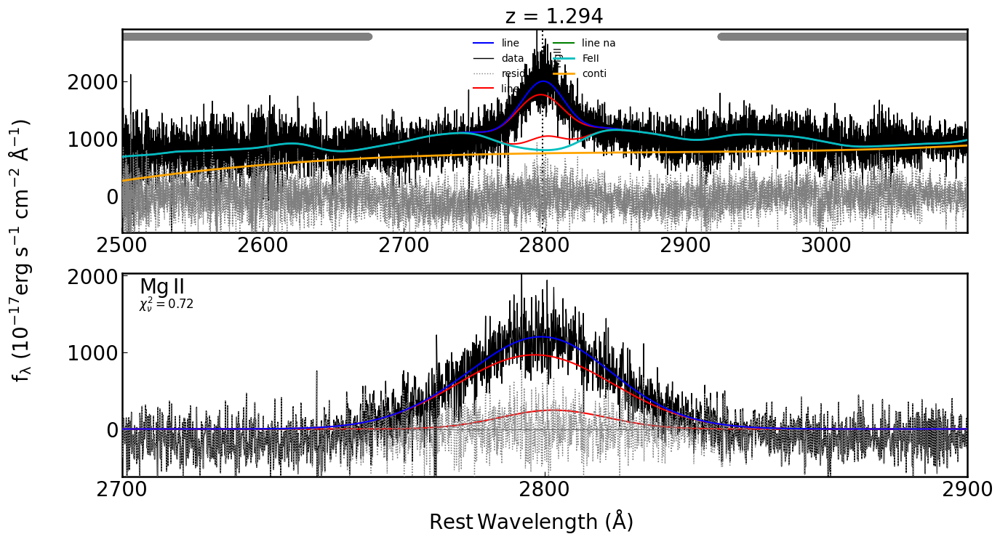

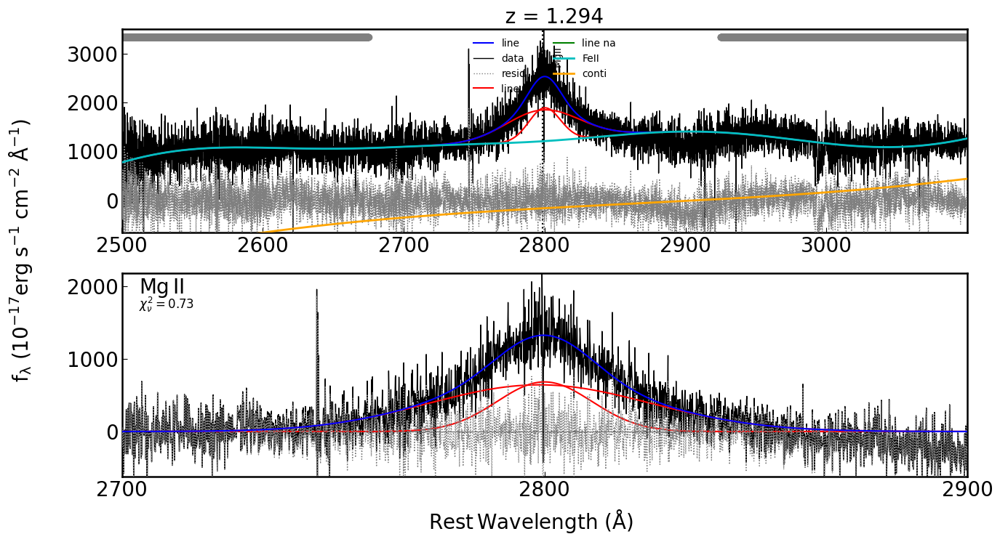

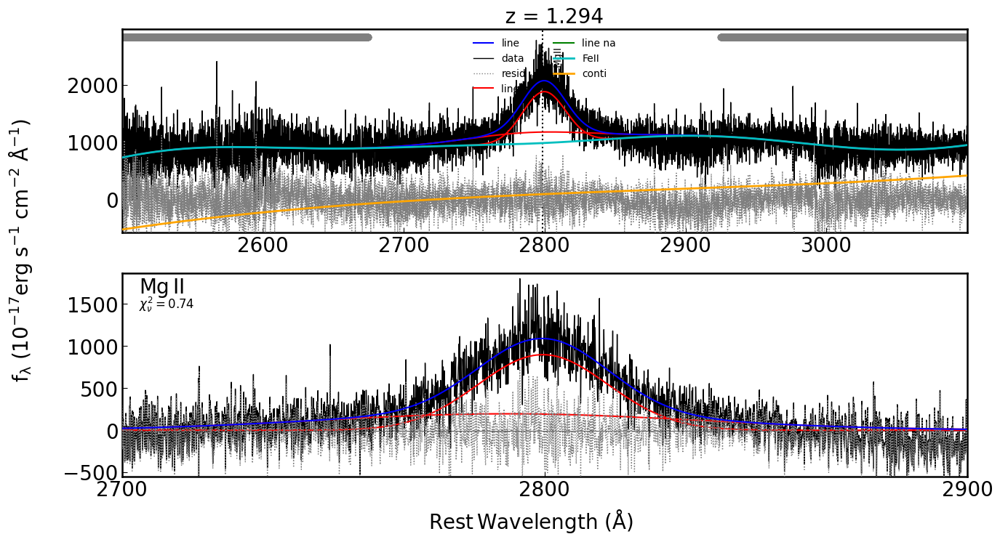

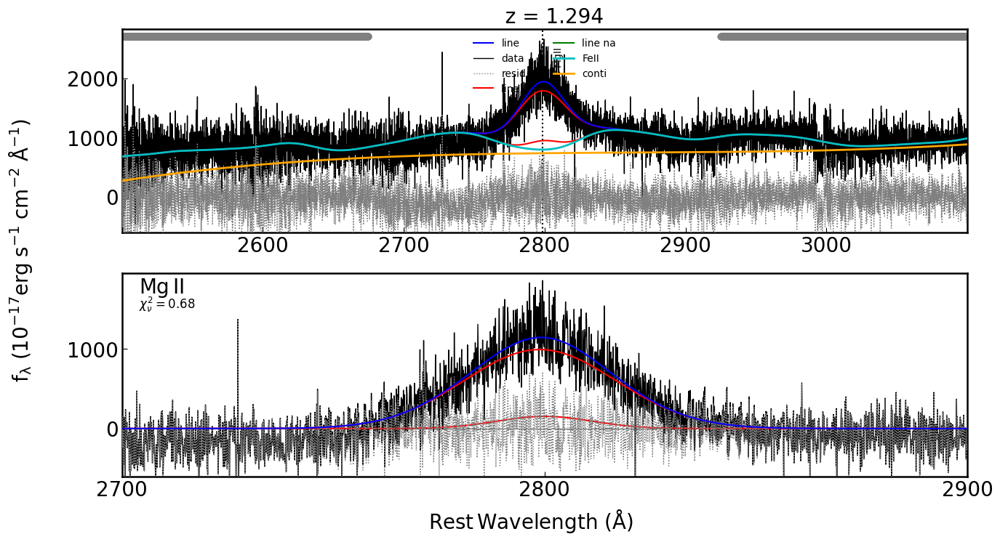

In [13]:
Fe_line = True
w_range = line_wrange
MC_sim = False
MCMC_sim = False
debug = True

for ep in epochs:
    path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')
    data = np.load(os.path.join(f'1D_extracted_COMBINED\epoch{ep}_3PSF_3PSFextract_combined.npy'))
    
    lam = 10 * data[0]    
    flux_b = data[2]   
    err_b = data[5]   

    q_mle = QSOFit(lam, flux_b, err_b, z, path=path_ex)
    start = timeit.default_timer()
   
    q_mle.Fit(name=None, nsmooth=1, and_mask=False, or_mask=False, reject_badpix=True, deredden=True, wave_range=w_range, wave_mask=None, 
              # host decomposition
              decompose_host=False, host_prior=False, host_prior_scale=0.2, host_line_mask=True, decomp_na_mask=True,  qso_type='CZBIN1',  npca_qso=10, host_type='PCA', npca_gal=5, 
              # continuum model fit parameters
              Fe_uv_op=Fe_line, poly=True, BC=False, initial_guess=None, rej_abs_conti=False, n_pix_min_conti=100,  
              # emission line fit parameters
              linefit=True, rej_abs_line=False,
              # fitting method selection
              MC=MC_sim, MCMC=MCMC_sim, nsamp=200,
              # advanced fitting parameters
              param_file_name='qsopar.fits', nburn=20, nthin=10, epsilon_jitter=0.,
              # customize the results
              save_result=False,  save_fits_name=None, save_fits_path=path_out, plot_fig=True, save_fig=False, plot_corner=True, 
              # debugging mode
              verbose=debug,  
              # sublevel parameters for figure plot and emcee
              kwargs_plot={
                  'save_fig_path': '.',  
                  'broad_fwhm'   : 1200  
              },
              kwargs_conti_emcee={},
              kwargs_line_emcee={})

    end = timeit.default_timer()

    print(f'Fitting finished in {np.round(end - start, 1)}s')

    wh_fwhm, wh_sigma, wh_ew, wh_peak, wh_area, wh_snr = q_mle.line_prop_from_name(rf"{line_name}_br", 'broad')
    params_b_Fe[os.path.join(f'epoch{ep}')]["whole"] = [wh_fwhm, wh_peak - lam_0]
    

### Image A, without FeII

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_op_norm          0        0    1e+10     None    False     None     None
Fe_op_shift         0    -0.01     0.01     None    False     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_uv_norm          0        0    1e+10     None    False     None     None
Fe_uv_shift         0    -0.01     0.01     None    False     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_slope         -1.5       -5        3     None     True     None     None
conti_a_0           0     -inf      inf     None     True     None     None
conti_a_1 

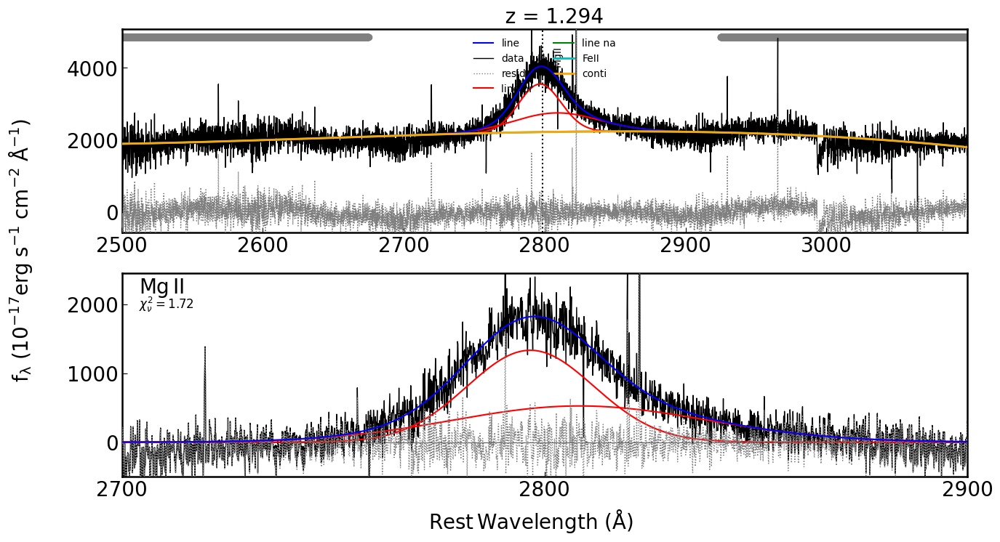

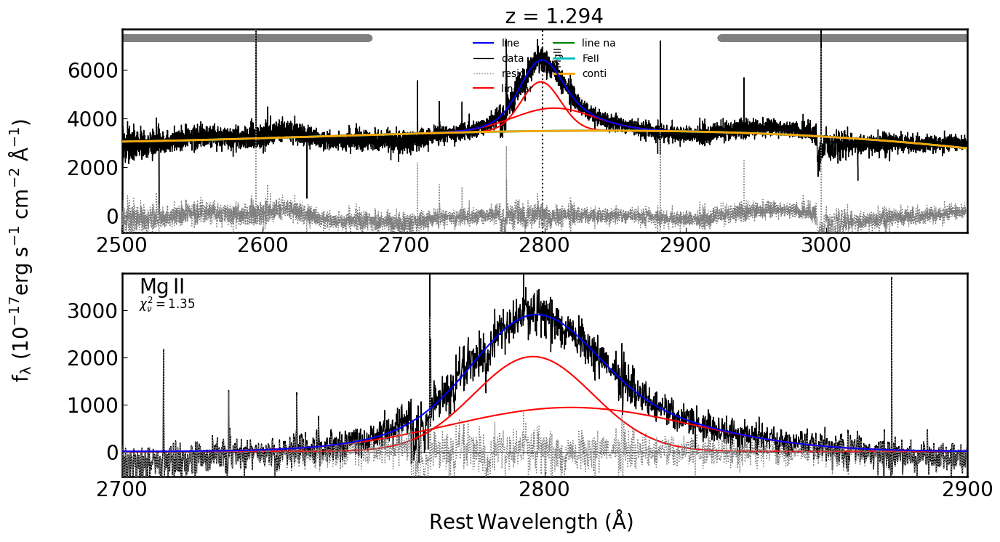

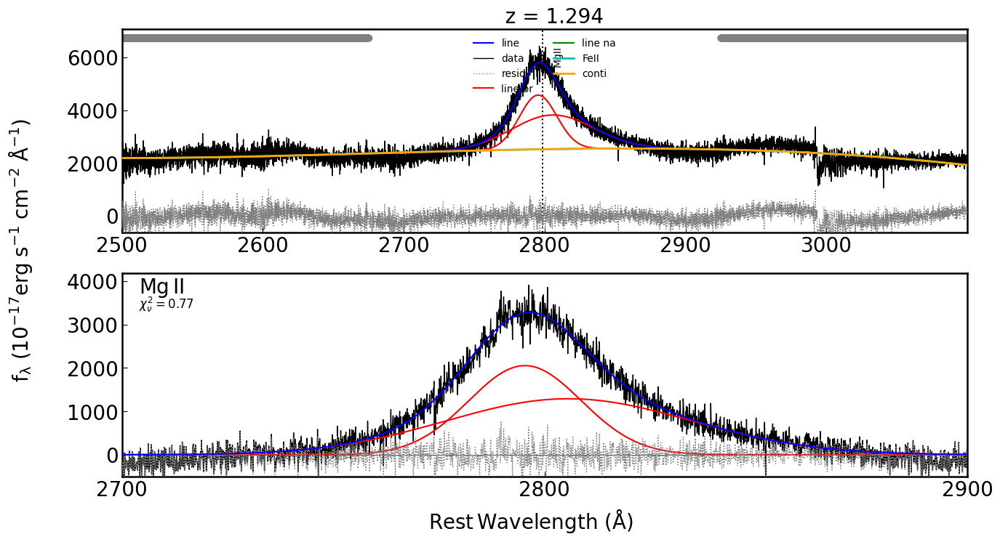

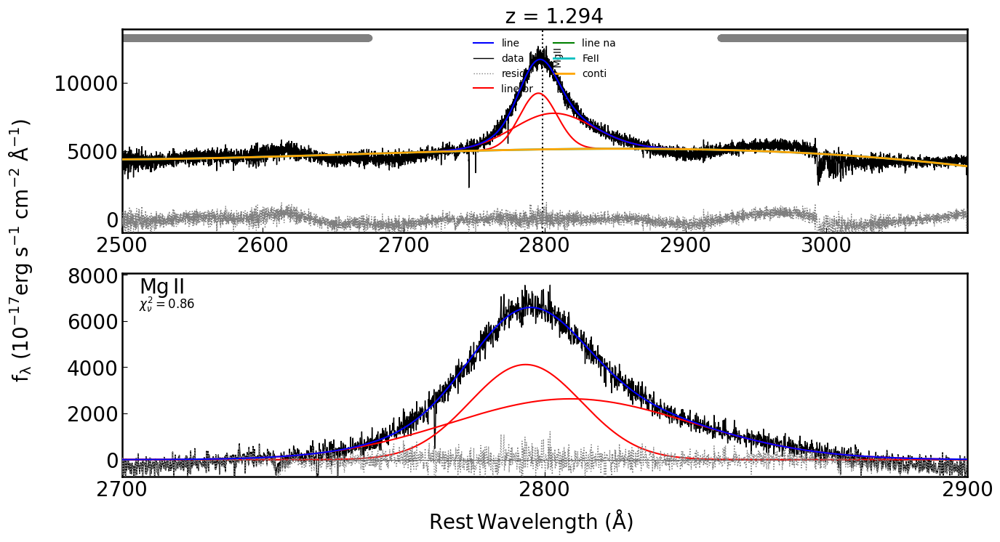

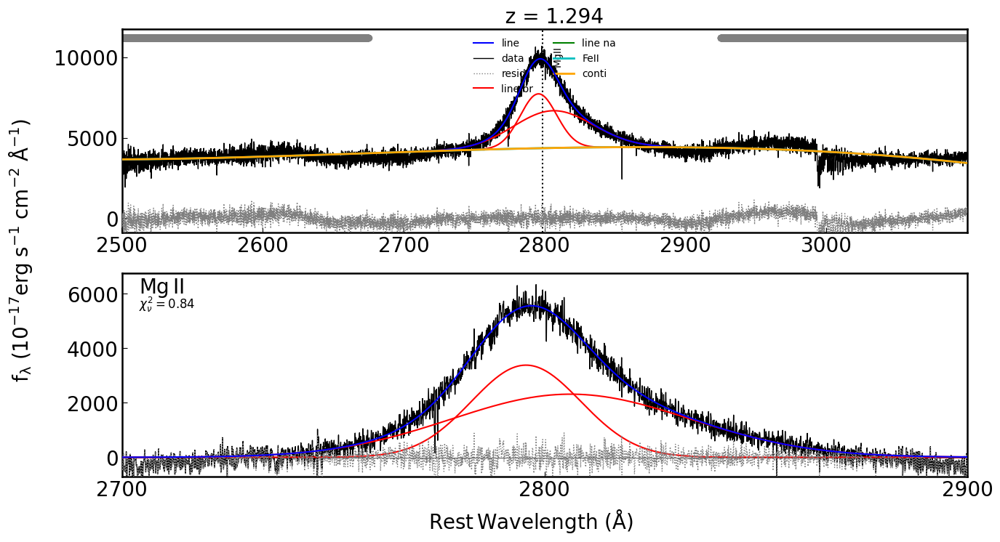

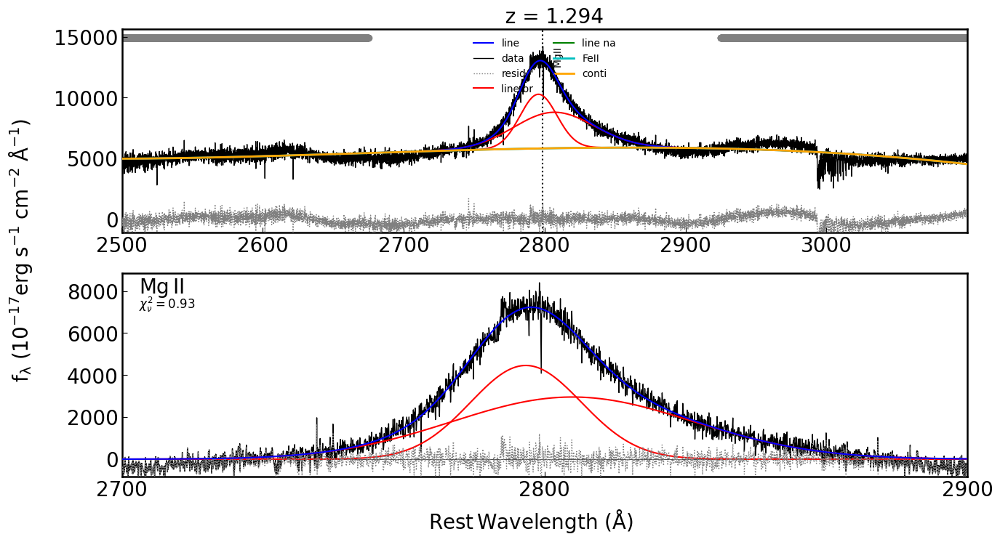

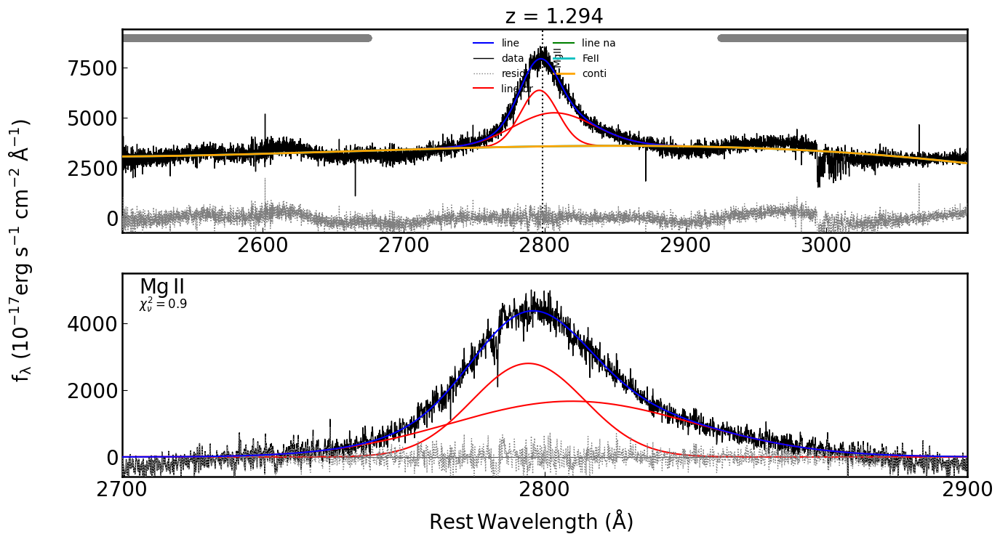

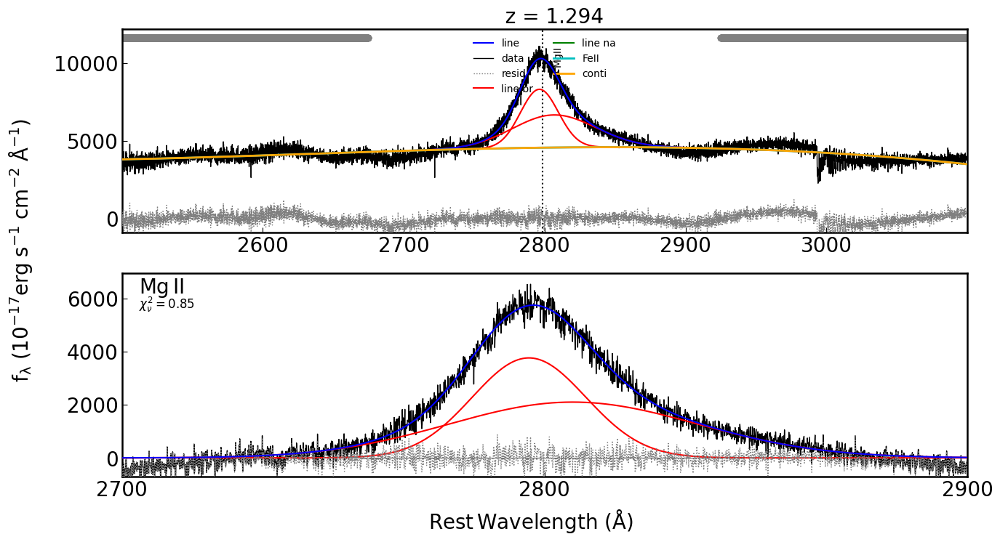

In [14]:
Fe_line = False
w_range = line_wrange
MC_sim = False
MCMC_sim = False
debug = True

epochs = [0,1,2,3,4,5,6,7]

for ep in epochs:
    path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')
    data = np.load(os.path.join(f'1D_extracted_COMBINED\epoch{ep}_3PSF_3PSFextract_combined.npy'))
    
    lam = 10 * data[0]  
    flux_a = data[1]  
    err_a = data[4]   

    q_mle = QSOFit(lam, flux_a, err_a, z, path=path_ex)
    start = timeit.default_timer()
   
    q_mle.Fit(name=None, nsmooth=1, and_mask=False, or_mask=False, reject_badpix=True, deredden=True, wave_range=w_range, wave_mask=None, 
             # host decomposition
              decompose_host=False, host_prior=False, host_prior_scale=0.2, host_line_mask=True, decomp_na_mask=True,  qso_type='CZBIN1',  npca_qso=10, host_type='PCA', npca_gal=5, 
              # continuum model fit parameters
              Fe_uv_op=Fe_line, poly=True, BC=False, initial_guess=None, rej_abs_conti=False, n_pix_min_conti=100,  
              # emission line fit parameters
              linefit=True, rej_abs_line=False,
              # fitting method selection
              MC=MC_sim, MCMC=MCMC_sim, nsamp=200,
              # advanced fitting parameters
              param_file_name='qsopar.fits', nburn=20, nthin=10, epsilon_jitter=0.,
              # customize the results
              save_result=False,  save_fits_name=None, save_fits_path=path_out, plot_fig=True, save_fig=False, plot_corner=True, 
              # debugging mode
              verbose=debug,  
              # sublevel parameters for figure plot and emcee
              kwargs_plot={
                  'save_fig_path': '.',  
                  'broad_fwhm'   : 1200  
              },
              kwargs_conti_emcee={},
              kwargs_line_emcee={})

    end = timeit.default_timer()

    print(f'Fitting finished in {np.round(end - start, 1)}s')

    wh_fwhm, wh_sigma, wh_ew, wh_peak, wh_area, wh_snr = q_mle.line_prop_from_name(rf"{line_name}_br", 'broad')
    params_a[os.path.join(f'epoch{ep}')]["whole"] = [wh_fwhm, wh_peak - lam_0]

### Image B, wihtout FeII

Name            Value      Min      Max   Stderr     Vary     Expr Brute_Step
Balmer_Tau        0.5      0.1        2     None    False     None     None
Balmer_Te     1.5e+04    1e+04    5e+04     None    False     None     None
Blamer_norm         0        0    1e+10     None    False     None     None
Fe_op_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_op_norm          0        0    1e+10     None    False     None     None
Fe_op_shift         0    -0.01     0.01     None    False     None     None
Fe_uv_FWHM       3000     1200  1.8e+04     None    False     None     None
Fe_uv_norm          0        0    1e+10     None    False     None     None
Fe_uv_shift         0    -0.01     0.01     None    False     None     None
PL_norm             1        0    1e+10     None     True     None     None
PL_slope         -1.5       -5        3     None     True     None     None
conti_a_0           0     -inf      inf     None     True     None     None
conti_a_1 

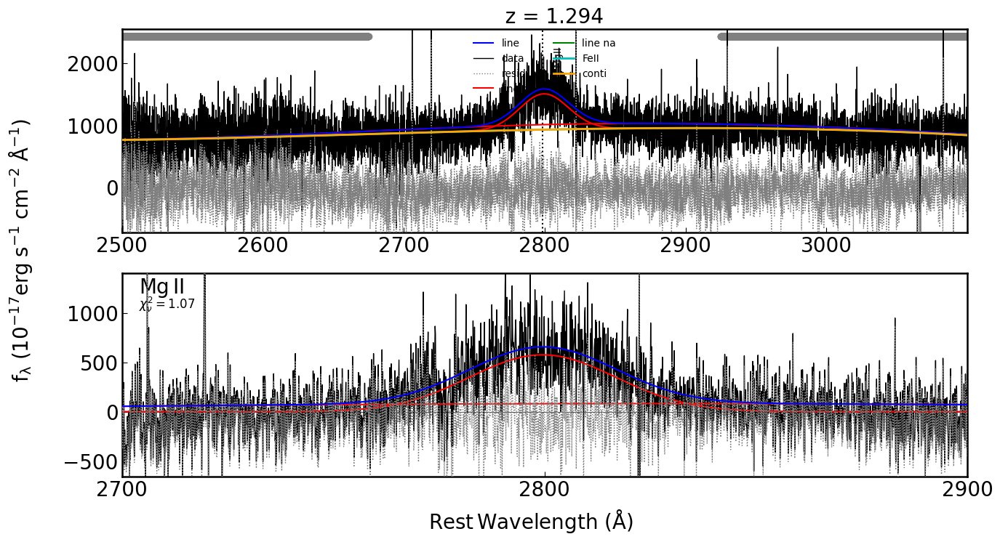

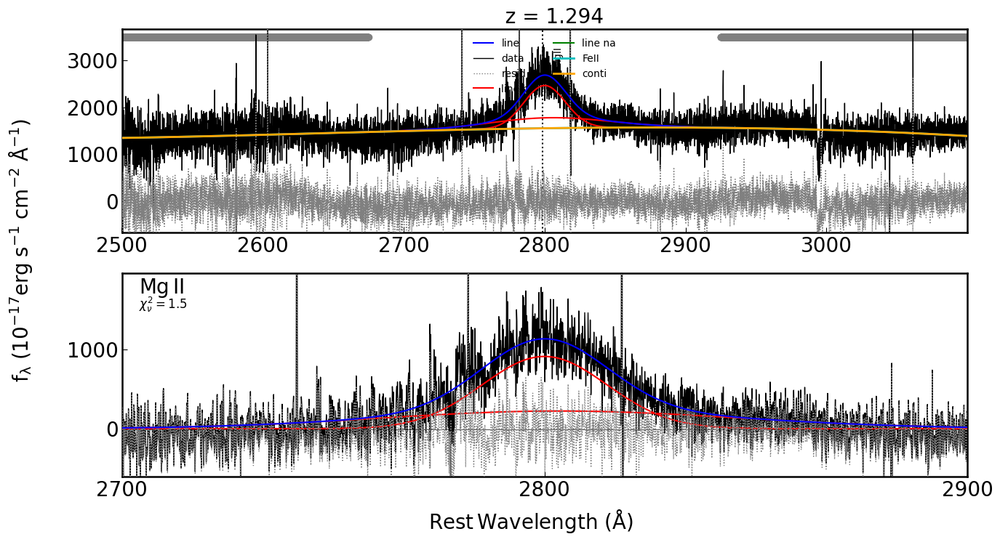

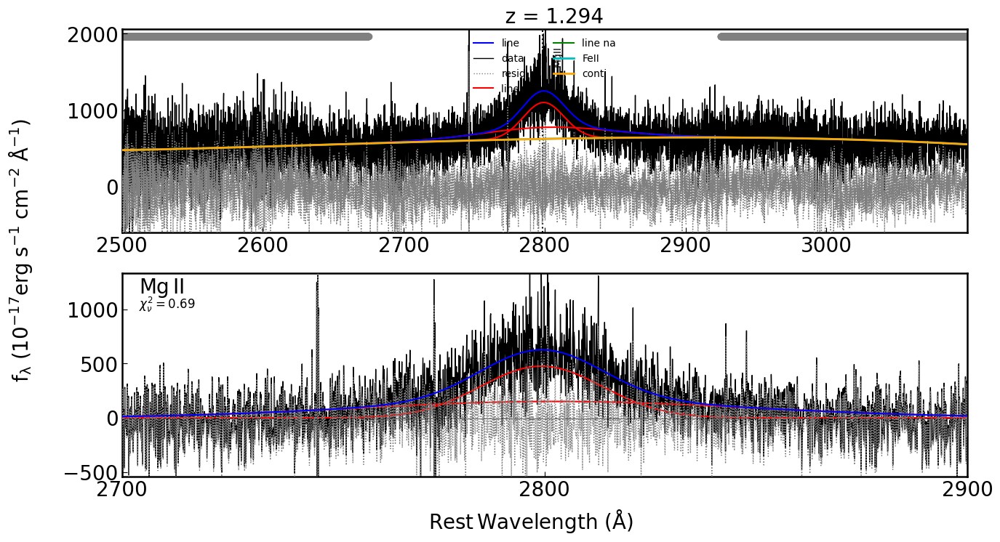

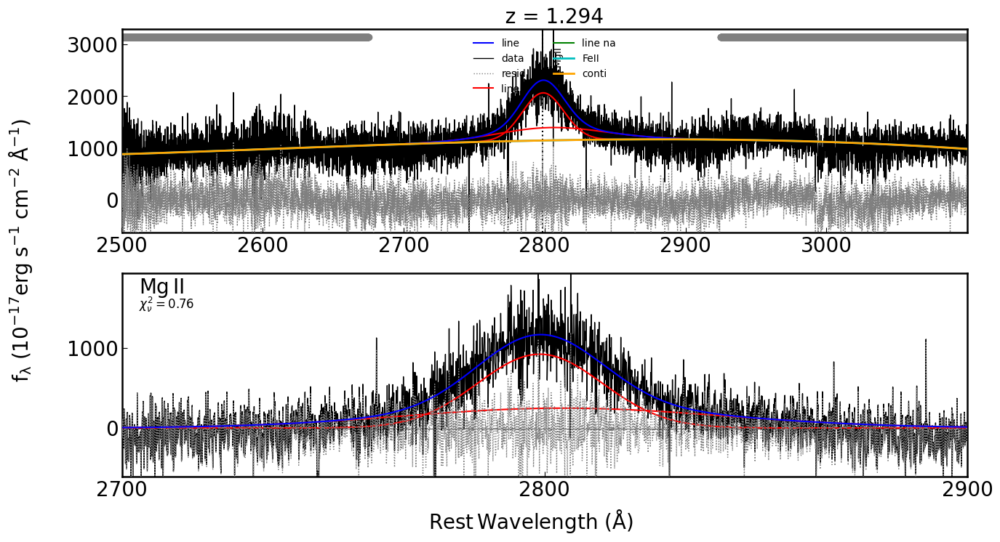

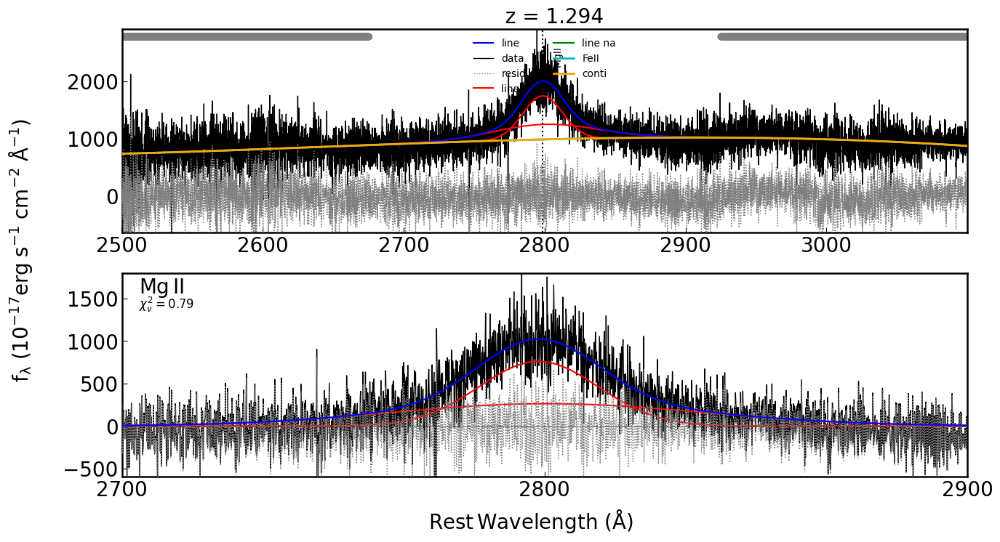

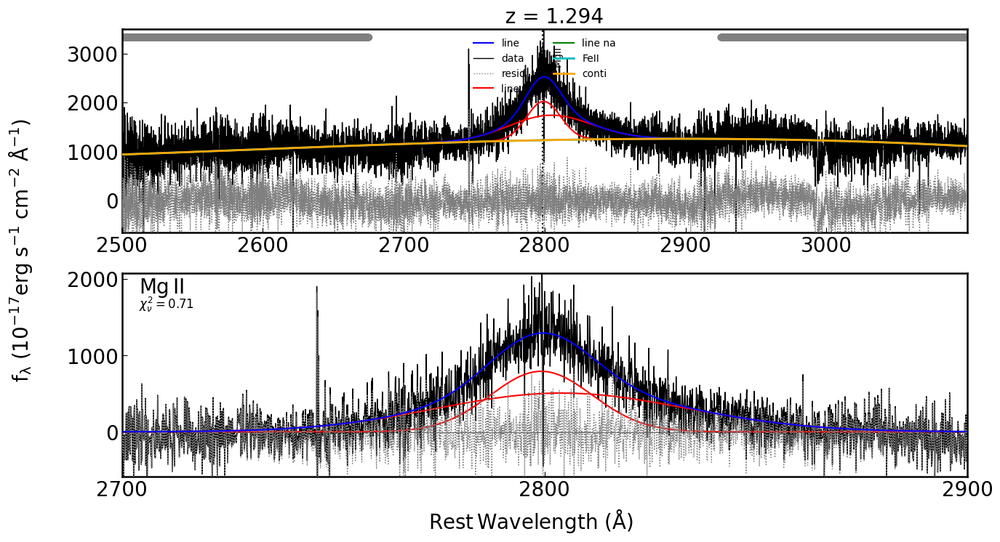

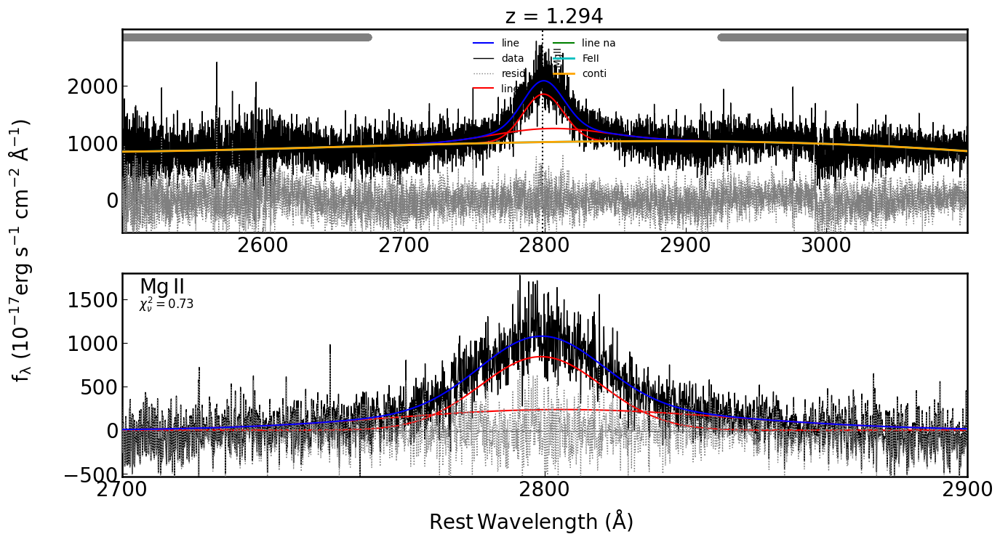

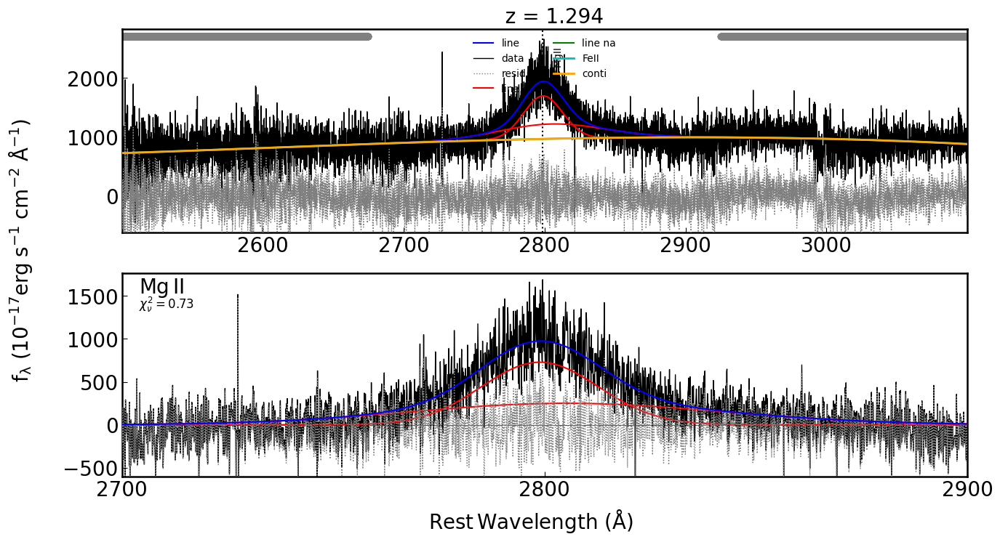

In [15]:
Fe_line = False
w_range = line_wrange
MC_sim = False
MCMC_sim = False
debug = True

for ep in epochs:
    path_out = os.path.join(pyqsofit.__path__[0], '../', '1D_extracted_COMBINED')
    data = np.load(os.path.join(f'1D_extracted_COMBINED\epoch{ep}_3PSF_3PSFextract_combined.npy'))
    
    lam = 10 * data[0]    
    flux_b = data[2]  
    err_b = data[5]   

    q_mle = QSOFit(lam, flux_b, err_b, z, path=path_ex)
    start = timeit.default_timer()
   
    q_mle.Fit(name=None, nsmooth=1, and_mask=False, or_mask=False, reject_badpix=True, deredden=True, wave_range=w_range, wave_mask=None, 
             # host decomposition
              decompose_host=False, host_prior=False, host_prior_scale=0.2, host_line_mask=True, decomp_na_mask=True,  qso_type='CZBIN1',  npca_qso=10, host_type='PCA', npca_gal=5, 
              # continuum model fit parameters
              Fe_uv_op=Fe_line, poly=True, BC=False, initial_guess=None, rej_abs_conti=False, n_pix_min_conti=100,  
              # emission line fit parameters
              linefit=True, rej_abs_line=False,
              # fitting method selection
              MC=MC_sim, MCMC=MCMC_sim, nsamp=200,
              # advanced fitting parameters
              param_file_name='qsopar.fits', nburn=20, nthin=10, epsilon_jitter=0.,
              # customize the results
              save_result=False,  save_fits_name=None, save_fits_path=path_out, plot_fig=True, save_fig=False, plot_corner=True, 
              # debugging mode
              verbose=debug,  
              # sublevel parameters for figure plot and emcee
              kwargs_plot={
                  'save_fig_path': '.',  
                  'broad_fwhm'   : 1200  
              },
              kwargs_conti_emcee={},
              kwargs_line_emcee={})

    end = timeit.default_timer()

    print(f'Fitting finished in {np.round(end - start, 1)}s')

    wh_fwhm, wh_sigma, wh_ew, wh_peak, wh_area, wh_snr = q_mle.line_prop_from_name(rf"{line_name}_br", 'broad')
    params_b[os.path.join(f'epoch{ep}')]["whole"] = [wh_fwhm, wh_peak - lam_0]

### Create complete dictionaries with all parameters, with and without FeII

In [16]:
# structure of dictionary: {initial conditions: { continuum prior : [],
#                                                 line prior: []},
#                           image a:
#                            {epoch2:    
#                               {broad 1: [(flux, unc),(dwave,unc),(sigma,unc), (FWHM,unc)], 
#                                broad 2: [...],
#                                narrow: [...], if narrow == True
#                                continuum fit:,
#                                continuum correlation matrix: ,        
#                                parameters correlation matrix: ,
#                                whole fit (blue line): [whole_FWHM, whole_dwave] }}
#                           image B: ...}
# UNITS: flux [ADD!!], dwave [A], sigma [A], FWHM [km/s], whole_FWHM [km/s], dwave [A]
decoded_compname = np.char.decode(line_priors.compname)
match_line = line_priors[decoded_compname == line_name]
line_pr = []
for row in match_line:
    line_pr.append(row)
prior_cond = {"conti": conti_priors,
              "line": line_pr }

dict_Fe = {"prior" : prior_cond, # for Mg broad prior
           "a": params_a_Fe, 
           "b": params_b_Fe}

dict_no_Fe = {"prior" : prior_cond,
              "a": params_a, 
              "b": params_b}
#print(dict_no_Fe)


# Save dictionary file
import pickle

with open(f'dict_param_{line_name}.pkl', 'wb') as f:
    pickle.dump(dict_no_Fe, f)


Display table with parameters

In [17]:
import pandas as pd

# Define rows 
quantities = ['I_B/I_R', 'Δλ_B [Å]', 'Δλ_R [Å]', 'FWHM_B [km/s]', 'FWHM_R [km/s]']
epochs = [f'epoch{i}' for i in range(0, 8)]  

def extract_image_data(image_data, label):
    table_data = {f'{q} ({label})': [] for q in quantities}
    
    for ep in epochs:
        ep_data = image_data.get(ep, {})
        b1 = ep_data.get('br_1', [])
        b2 = ep_data.get('br_2', [])

        if b1 and b2:
            flux1, flux2 = b1[0][0], b2[0][0]
            flux_ratio = flux1 / flux2 if flux2 != 0 else float('nan')
            dwave1 = b1[1][0]
            dwave2 = b2[1][0]
            fwhm1 = b1[3][0]
            fwhm2 = b2[3][0]

            values = [flux_ratio, dwave1, dwave2, fwhm1, fwhm2]
        else:
            values = [float('nan')] * 5

        for q, v in zip(quantities, values):
            table_data[f'{q} ({label})'].append(v)
    
    return pd.DataFrame(table_data, index=epochs).T

tab_Fe_a = extract_image_data(dict_Fe["a"], 'Image A')
tab_Fe_b = extract_image_data(dict_Fe["b"], 'Image B')

Fe_table = pd.concat([tab_Fe_a, tab_Fe_b])

tab_no_a = extract_image_data(dict_no_Fe["a"], 'Image A')
tab_no_b = extract_image_data(dict_no_Fe["b"], 'Image B')

noFe_table = pd.concat([tab_no_a, tab_no_b])

print(Fe_table)
print(noFe_table)

# Optional: save to file
# final_table.to_csv("combined_flux_dw_fwhm_table.csv")


                              epoch0        epoch1       epoch2        epoch3  \
I_B/I_R (Image A)           5.159310      1.985841    10.266192     13.152550   
Δλ_B [Å] (Image A)         -4.538812     -1.306639    -3.385070     -3.009337   
Δλ_R [Å] (Image A)         17.780326     -0.834088    26.471213     26.739798   
FWHM_B [km/s] (Image A)  3976.027997   3588.014721  4209.311663   4228.925475   
FWHM_R [km/s] (Image A)  2823.146656   7946.353239  2823.146656   2823.146656   
I_B/I_R (Image B)           3.506734      0.239638     0.967299      0.189371   
Δλ_B [Å] (Image B)         -4.851409     -8.734676    -4.993639    -10.528648   
Δλ_R [Å] (Image B)         11.232490      0.465271     0.882413     -0.453036   
FWHM_B [km/s] (Image B)  4450.196652  11872.778549  5662.328784  10907.036541   
FWHM_R [km/s] (Image B)  2823.146656   3961.425271  3270.417780   3970.960449   

                              epoch4       epoch5        epoch6       epoch7  
I_B/I_R (Image A)           0

## Plotting of the extracted parameters against time 

Relevant parameters for analysis: 
- $\Delta$ $\lambda$: shift in peak's position of the Gaussian profile with respect to the rest wavelength
- FWHM: Full width at half maximum of Gaussian profile

Other parameters plotted:
- Flux: peak flux on Gaussian profile
- $\Delta$ $\lambda$ and FWHM for "whole": PyQSO also gives as output these parameters for the whole fit result (blue line profile in plots). Less relevant as it is not a Gaussian

In [18]:
import matplotlib.pyplot as plt
from astropy.time import Time

dates01 = ["2019-10-11","2019-09-04"] #dates for epoch 0 and 1

# Time array from dates of data collection (YYYY-MM-DD) in HJD - 2400000.5
dates = ["2024-08-06", "2024-09-16", "2024-10-07", "2024-11-14", "2024-12-10", "2025-01-16"]

t_hjd = Time(dates, format='iso', scale='utc')
t = t_hjd.jd - 2400000.5

# Keys to plot
images = ["a", "b"]
epochs = [f"epoch{i}" for i in range(2, 8)]  # for epochs 2 to 7
if narrow == True:
    br_keys = ["br_1", "br_2", "na","whole"] 
else:
    br_keys = ["br_1", "br_2", "whole"]  

Plot of parameters using FeII template

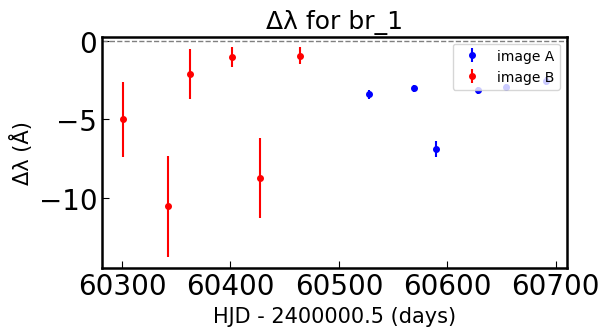

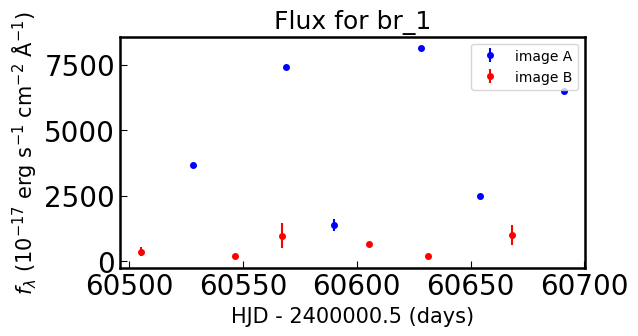

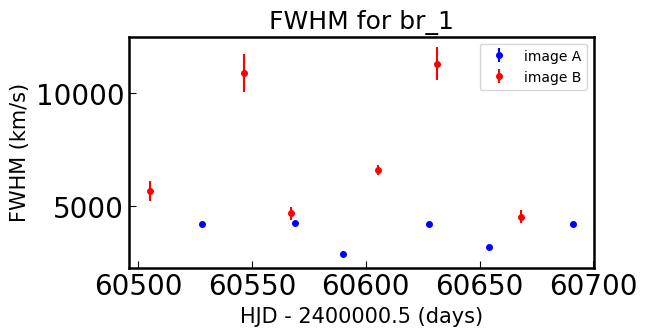

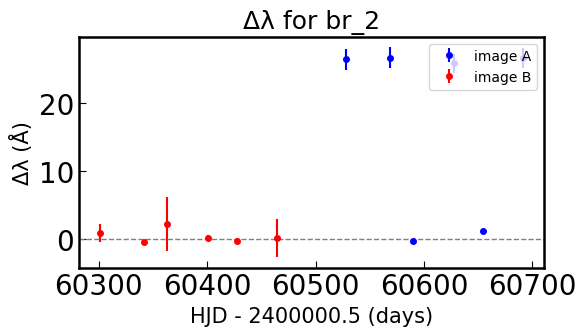

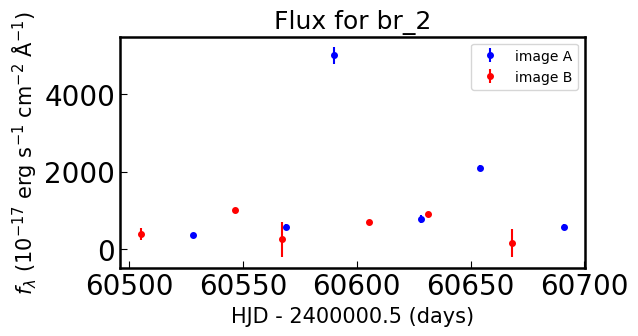

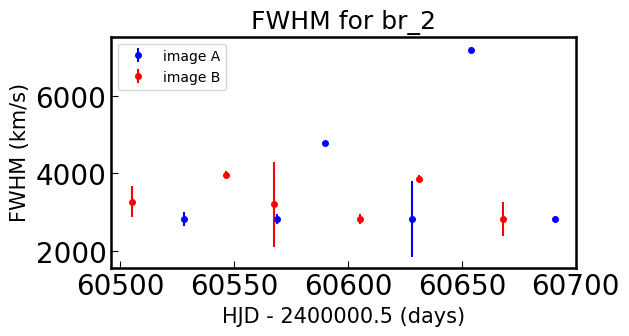

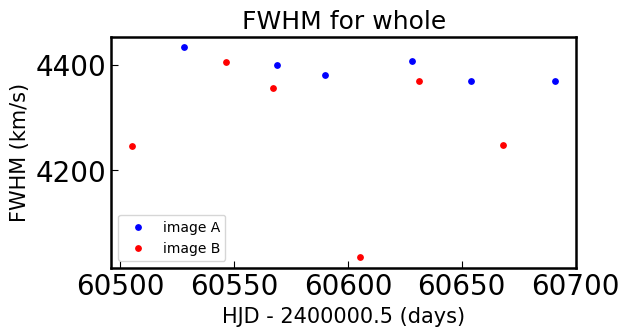

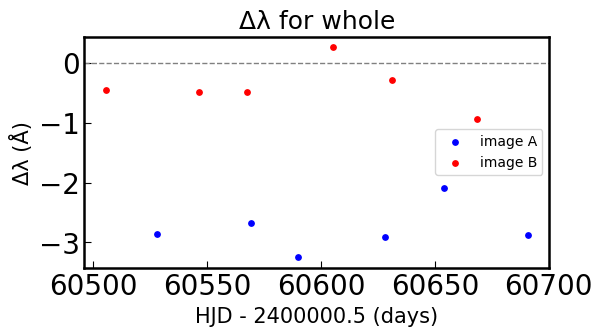

In [19]:
# Dictionary to store results to plot
results = {}

for br_key in br_keys:
    results[br_key] = {}
    for image in images:
        flux, flux_err = [], []
        dwave, dwave_err = [], []
        fwhm, fwhm_err = [], []

        for epoch in epochs:
            data = dict_Fe[image][epoch][br_key]
            if br_key == "whole":
                fwhm.append(data[0])
                dwave.append(data[1])
            else:
                flux.append(data[0][0])
                flux_err.append(data[0][1])
                dwave.append(data[1][0])
                dwave_err.append(data[1][1])
                fwhm.append(data[3][0])
                fwhm_err.append(data[3][1])
        if br_key == "whole":
            results[br_key][f"{image}_fwhm"] = fwhm
            results[br_key][f"{image}_dwave"] = dwave
        else:
            results[br_key][f"{image}_flux"] = flux
            results[br_key][f"{image}_flux_err"] = flux_err
            results[br_key][f"{image}_dwave"] = dwave
            results[br_key][f"{image}_dwave_err"] = dwave_err
            results[br_key][f"{image}_fwhm"] = fwhm
            results[br_key][f"{image}_fwhm_err"] = fwhm_err
    if br_key == "whole":
        # Plot fwhm
        plt.figure(figsize=(6, 3))
        plt.scatter(t, results[br_key]["a_fwhm"], s = 15, label='image A', color='blue')
        plt.scatter(t -  22.7, results[br_key]["b_fwhm"], s = 15, label='image B', color='red') # Shift image B by time delay of 22.7 days from microlensing
        plt.title(f"FWHM for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("FWHM (km/s)")
        plt.legend(fontsize=10)
        plt.show()

        # Plot dwave
        plt.figure(figsize=(6, 3))
        plt.scatter(t, results[br_key]["a_dwave"], s = 15, label='image A', color='blue')
        plt.scatter(t - 22.7, results[br_key]["b_dwave"], s = 15, label='image B', color='red')
        plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
        plt.title(f"Δλ for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("Δλ (Å)")
        plt.legend(fontsize=10)
        plt.show()
    
    else:
        # Plot dwave
        plt.figure(figsize=(6, 3))
        plt.errorbar(t, results[br_key]["a_dwave"], yerr=results[br_key]["a_dwave_err"], fmt='o', markersize = 4, label='image A', color='blue')
        plt.errorbar(t - 227, results[br_key]["b_dwave"], yerr=results[br_key]["b_dwave_err"], fmt='o', markersize = 4, label='image B', color='red')
        plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
        plt.title(f"Δλ for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("Δλ (Å)")
        plt.legend(loc='upper right',fontsize=10)
        plt.show()

        # Plot flux
        plt.figure(figsize=(6, 3))
        plt.errorbar(t, results[br_key]["a_flux"], yerr=results[br_key]["a_flux_err"], fmt='o', markersize = 4, label='image A', color='blue')
        plt.errorbar(t - 22.7, results[br_key]["b_flux"], yerr=results[br_key]["b_flux_err"], fmt='o', markersize = 4, label='image B', color='red')
        plt.title(f"Flux for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel(r"$f_\lambda\ (10^{-17}\ \mathrm{erg}\ \mathrm{s}^{-1}\ \mathrm{cm}^{-2}\ \mathrm{\AA}^{-1})$")
        plt.legend(fontsize=10)
        plt.show()

        # Plot fwhm
        plt.figure(figsize=(6, 3))
        plt.errorbar(t, results[br_key]["a_fwhm"], yerr=results[br_key]["a_fwhm_err"], fmt='o', markersize = 4, label='image A', color='blue')
        plt.errorbar(t - 22.7, results[br_key]["b_fwhm"], yerr=results[br_key]["b_fwhm_err"], fmt='o', markersize = 4, label='image B', color='red')
        plt.title(f"FWHM for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("FWHM (km/s)")
        plt.legend(fontsize=10)
        plt.show()

Plot of parameters against time (without FeII line)

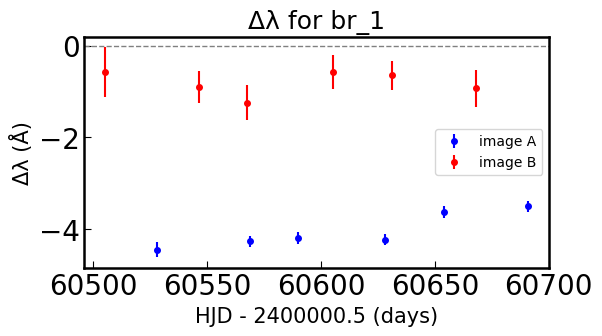

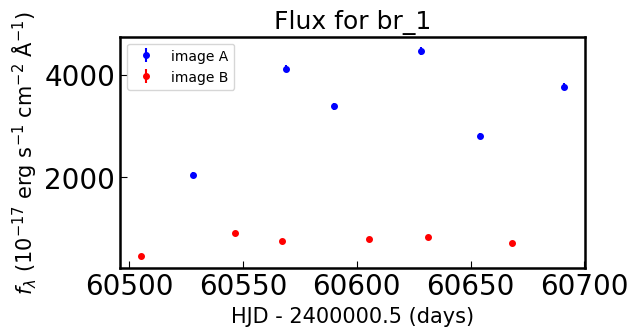

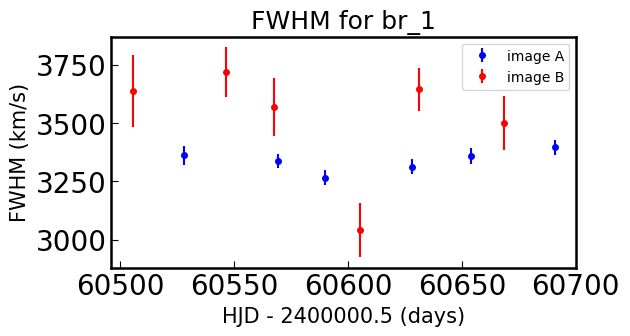

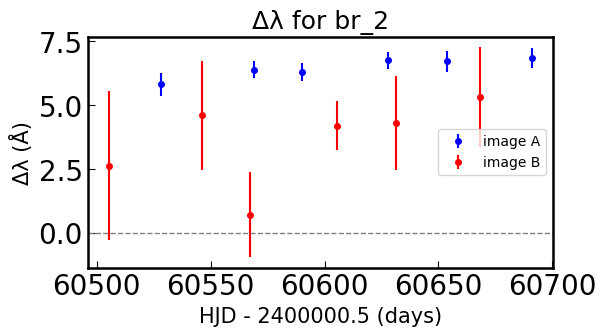

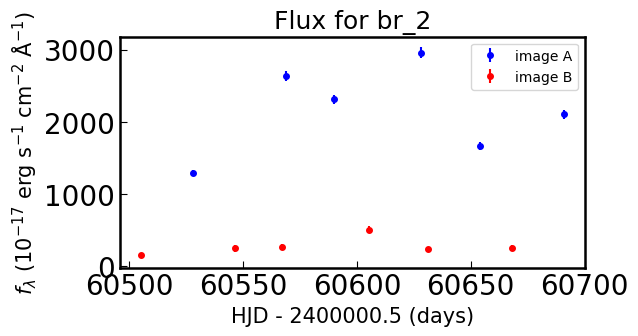

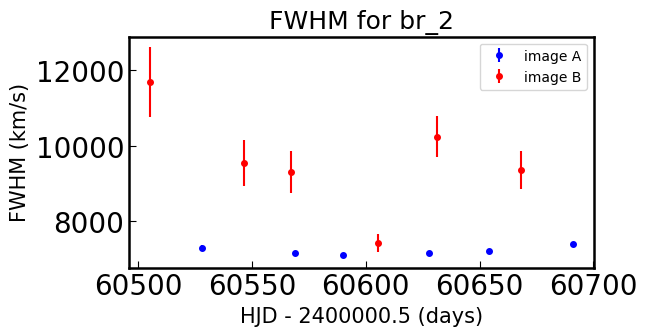

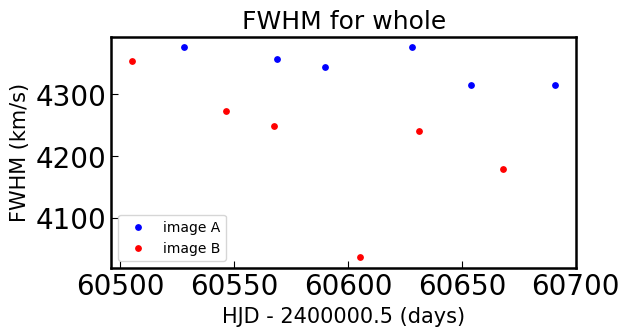

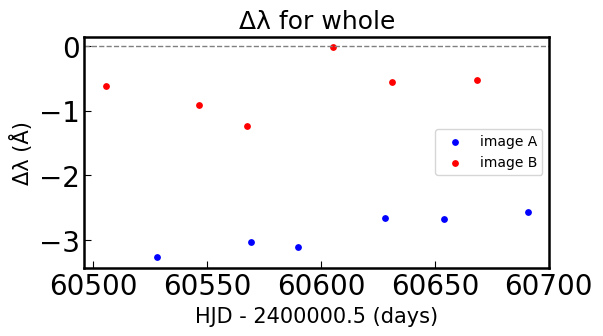

In [20]:
results = {}

for br_key in br_keys:
    results[br_key] = {}
    for image in images:
        flux, flux_err = [], []
        dwave, dwave_err = [], []
        fwhm, fwhm_err = [], []

        for epoch in epochs:
            data = dict_no_Fe[image][epoch][br_key]
            if br_key == "whole":
                fwhm.append(data[0])
                dwave.append(data[1])
            else:
                flux.append(data[0][0])
                flux_err.append(data[0][1])
                dwave.append(data[1][0])
                dwave_err.append(data[1][1])
                fwhm.append(data[3][0])
                fwhm_err.append(data[3][1])
        if br_key == "whole":
            results[br_key][f"{image}_fwhm"] = fwhm
            results[br_key][f"{image}_dwave"] = dwave
        else:
            results[br_key][f"{image}_flux"] = flux
            results[br_key][f"{image}_flux_err"] = flux_err
            results[br_key][f"{image}_dwave"] = dwave
            results[br_key][f"{image}_dwave_err"] = dwave_err
            results[br_key][f"{image}_fwhm"] = fwhm
            results[br_key][f"{image}_fwhm_err"] = fwhm_err
    if br_key == "whole":
        # Plot fwhm
        plt.figure(figsize=(6, 3))
        plt.scatter(t, results[br_key]["a_fwhm"], s=15, label='image A', color='blue')
        plt.scatter(t -22.7, results[br_key]["b_fwhm"], s=15, label='image B', color='red')
        plt.title(f"FWHM for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("FWHM (km/s)")
        plt.legend(fontsize = 10)
        plt.show()

        # Plot dwave
        plt.figure(figsize=(6, 3))
        plt.scatter(t, results[br_key]["a_dwave"], s=15, label='image A', color='blue')
        plt.scatter(t - 22.7, results[br_key]["b_dwave"], s=15, label='image B', color='red')
        plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
        plt.title(f"Δλ for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("Δλ (Å)")
        plt.legend(fontsize = 10)
        plt.show()
    
    else:

        # Plot dwave
        plt.figure(figsize=(6, 3))
        plt.errorbar(t, results[br_key]["a_dwave"], yerr=results[br_key]["a_dwave_err"], fmt='o', markersize = 4, label='image A', color='blue')
        plt.errorbar(t - 22.7, results[br_key]["b_dwave"], yerr=results[br_key]["b_dwave_err"], fmt='o', markersize = 4, label='image B', color='red')
        plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
        plt.title(f"Δλ for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("Δλ (Å)")
        plt.legend(fontsize = 10)
        plt.show()

        # Plot flux
        plt.figure(figsize=(6, 3))
        plt.errorbar(t, results[br_key]["a_flux"], yerr=results[br_key]["a_flux_err"], fmt='o', markersize = 4, label='image A', color='blue')
        plt.errorbar(t - 22.7, results[br_key]["b_flux"], yerr=results[br_key]["b_flux_err"], fmt='o', markersize = 4, label='image B', color='red')
        plt.title(f"Flux for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel(r"$f_\lambda\ (10^{-17}\ \mathrm{erg}\ \mathrm{s}^{-1}\ \mathrm{cm}^{-2}\ \mathrm{\AA}^{-1})$")
        plt.legend(fontsize = 10)
        plt.show()

        # Plot fwhm
        plt.figure(figsize=(6, 3))
        plt.errorbar(t, results[br_key]["a_fwhm"], yerr=results[br_key]["a_fwhm_err"], fmt='o', markersize = 4, label='image A', color='blue')
        plt.errorbar(t - 22.7, results[br_key]["b_fwhm"], yerr=results[br_key]["b_fwhm_err"], fmt='o', markersize = 4, label='image B', color='red')
        plt.title(f"FWHM for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("FWHM (km/s)")
        plt.legend(fontsize = 10)
        plt.show()


### Fit of periodic function with fixed period

To check for periodictiy in the variation of $\Delta \lambda$. Here period is fixed (if quasar's period is known)

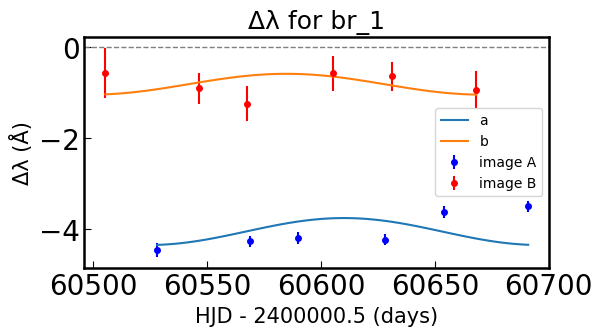

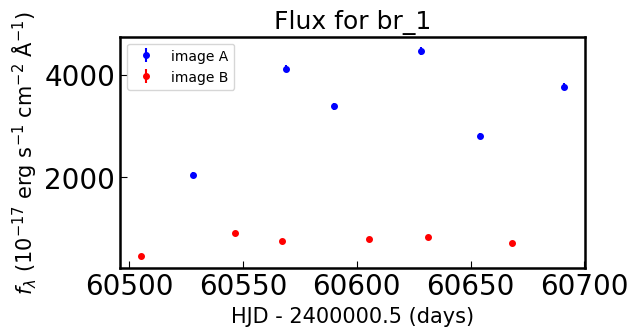

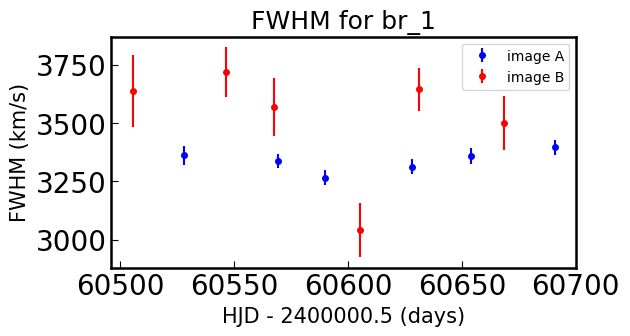

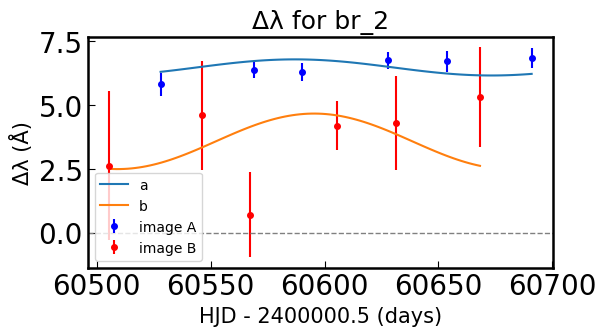

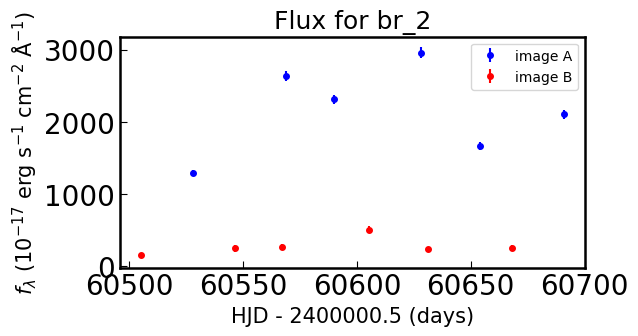

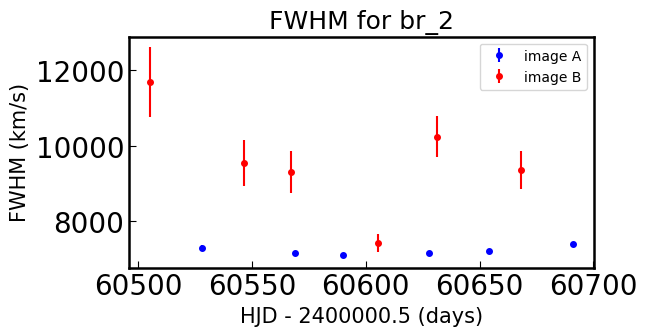

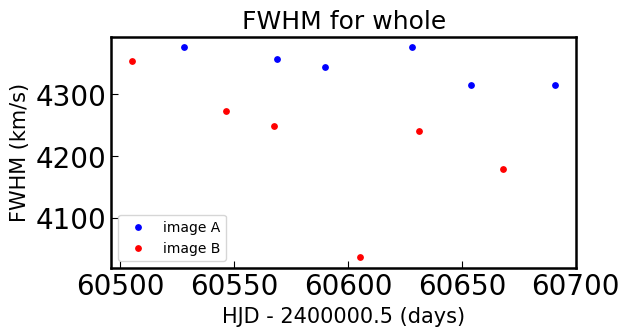

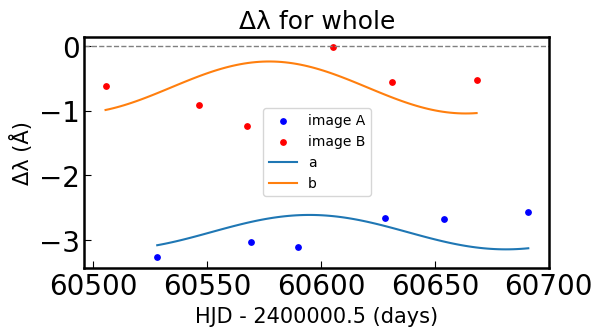

In [ ]:
import matplotlib.pyplot as plt
from astropy.time import Time
from scipy.optimize import curve_fit

t_sin = np.array(t) -np.array(t)[0]
#print(t_sin)

images = ["a", "b"]
epochs = [f"epoch{i}" for i in range(2, 8)]  # epochs 2 to 7
if narrow == True:
    br_keys = ["br_1", "br_2","na", "whole"] 
else:
    br_keys = ["br_1", "br_2", "whole"]  # adjust based on what's available

period = 172.6
# period = 172.6/2

omega = 2*np.pi /period
# Define sinusooidal function to fit
def sine_func(t, A, phi, offset):
    return A * np.sin(omega* t + phi) + offset

for br_key in br_keys:
    
    if br_key == "whole":
        dwave_sin_a = np.array(results[br_key]["a_dwave"])
        dwave_sin_b = np.array(results[br_key]["b_dwave"])
        
        # Initial guess: amplitude, frequency, phase, vertical shift
        A_guess_a = (np.max(dwave_sin_a) - np.min(dwave_sin_a)) / 2
        D_guess_a = np.mean(dwave_sin_a)
        A_guess_b = (np.max(dwave_sin_b) - np.min(dwave_sin_b)) / 2
        D_guess_b = np.mean(dwave_sin_b)
        C_guess = 0
        guess_a = [A_guess_a, C_guess, D_guess_a]
        guess_b = [A_guess_b,C_guess, D_guess_b]

        # Fit the curves
        popt_a, pcov_a = curve_fit(sine_func, t, dwave_sin_a, p0=guess_a)
        popt_b, pcov_b = curve_fit(sine_func, t- 22.7, dwave_sin_b, p0=guess_b)

        # Generate fit line
        x_fit_a = np.linspace(min(t_sin), max(t_sin), 100)
        x_fit_b = np.linspace(min(t_sin)-22.7, max(t_sin) -22.7, 100)
        y_fit_a = sine_func(x_fit_a, *popt_a)
        y_fit_b = sine_func(x_fit_b, *popt_b)

        # Plot dwave
        plt.figure(figsize=(6, 3))
        plt.scatter(t, results[br_key]["a_dwave"], s=15, label='image A', color='blue')
        plt.scatter(t - 22.7, results[br_key]["b_dwave"], s=15, label='image B', color='red')
        plt.plot(x_fit_a + np.array(t)[0], y_fit_a, label = 'a')
        plt.plot(x_fit_b + np.array(t)[0], y_fit_b, label = 'b')
        plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
        plt.title(f"Δλ for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("Δλ (Å)")
        plt.legend(fontsize = 10)
        plt.show()
    
    else:

        dwave_sin_a = np.array(results[br_key]["a_dwave"])
        dwave_sin_b = np.array(results[br_key]["b_dwave"])
        
        # Initial guess: amplitude, frequency, phase, vertical shift
        A_guess_a = (np.max(dwave_sin_a) - np.min(dwave_sin_a)) / 2
        D_guess_a = np.mean(dwave_sin_a)
        A_guess_b = (np.max(dwave_sin_b) - np.min(dwave_sin_b)) / 2
        D_guess_b = np.mean(dwave_sin_b)
        C_guess = 0
        guess_a = [A_guess_a,C_guess, D_guess_a]
        guess_b = [A_guess_b,  C_guess, D_guess_b]

        # Fit the curves
        popt_a, pcov_a = curve_fit(sine_func, t, dwave_sin_a, p0=guess_a)
        popt_b, pcov_b = curve_fit(sine_func, t - 22.7, dwave_sin_b, p0=guess_b)

        # Generate fit line
        x_fit_a = np.linspace(min(t_sin), max(t_sin), 100)
        x_fit_b = np.linspace(min(t_sin)-22.7, max(t_sin) -22.7, 100)
        y_fit_a = sine_func(x_fit_a, *popt_a)
        y_fit_b = sine_func(x_fit_b, *popt_b)

        # Plot dwave
        plt.figure(figsize=(6, 3))
        plt.errorbar(t, results[br_key]["a_dwave"], yerr=results[br_key]["a_dwave_err"], fmt='o', markersize = 4, label='image A', color='blue')
        plt.errorbar(t - 22.7, results[br_key]["b_dwave"], yerr=results[br_key]["b_dwave_err"], fmt='o', markersize = 4, label='image B', color='red')
        plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
        plt.plot(x_fit_a + np.array(t)[0], y_fit_a, label = 'a')
        plt.plot(x_fit_b + np.array(t)[0], y_fit_b, label = 'b')
        plt.title(f"Δλ for {br_key}")
        plt.xlabel("HJD - 2400000.5 (days)")
        plt.ylabel("Δλ (Å)")
        plt.legend(fontsize = 10)
        plt.show()

